# Bootes: Validation Checks (FULL)

In [3]:
%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.rc('figure', figsize=(10, 6))
plt.style.use('ggplot')

import numpy as np
from astropy.table import Table
import itertools

import time


In [4]:
t0 = time.time()

catname = "../../dmu1/dmu1_ml_Bootes/data/master_catalogue_bootes_20180307.fits"
master_catalogue = Table.read(catname)

print('Elapsed time(secs): ', time.time() - t0)

print("Number of sources in master catalogue: ", len(master_catalogue))

Elapsed time(secs):  33.977030754089355
Number of sources in master catalogue:  3388482


In [11]:
field = master_catalogue["field"][0]
field = field.rstrip()    # remove whitespaces at the end of the sting
print(field)

Bootes


In [4]:
#%%javascript
#IPython.OutputArea.auto_scroll_threshold = 9999;

In [8]:
u_bands = []
g_bands = ["DECAM g", "GPC1 g", "BASS g"]
r_bands = ["DECAM r", "GPC1 r", "BASS r", "MOSAIC r"]
i_bands = [           "GPC1 i",           "MOSAIC i"]
z_bands = ["DECAM z", "GPC1 z", "BASS z",            "90prime z"]
y_bands = [           "GPC1 y"]
J_bands = ["NEWFIRM J", "WFCAM J"]
H_bands = ["NEWFIRM H"]
K_bands = ["NEWFIRM K",                   "MOSAIC K"]

all_bands = [g_bands, r_bands, i_bands, z_bands, J_bands, K_bands]

irac_bands = ["IRAC i1", "IRAC i2", "IRAC i3", "IRAC i4"]

opt_mags = u_bands + g_bands + r_bands + i_bands + z_bands + y_bands
ir_mags = J_bands + H_bands + K_bands + irac_bands

other_bands = ["MOSAIC B"]

all_mags = opt_mags + ir_mags + other_bands

## 1/ Magnitude errors

In [9]:
def mag_vs_err(x, y, fig, ax, labels=("x", "y"), savefig=False):

    x_label, y_label = labels
    print(x_label)

    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & (x!=99.) & (y!=99.)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
   
    if len(x) > 0:
        print("    Error max: {:.0f}".format(np.max(y)))
        err10 = y > 10
        if len(x[err10]) > 0:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.min(x[err10])))
        else:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.nan))
        err100 = y > 100
        if len(x[err100]) > 0:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.min(x[err100])))
        else:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.nan))
        err1000 = y > 1000
        if len(x[err1000]) > 0:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.min(x[err1000])))
        else:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.nan))
    else:
        print("    no data")
    print("")


    # Plot
    ax.set_yscale('log')    # to place before scatter to avoid issues
    ax.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax.invert_xaxis()
    #ax.get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
    #ax.get_xaxis().get_major_formatter().labelOnlyBase = False
    ax.set_xlabel(labels[0])
    ax.set_ylabel(labels[1])

    # Save ex. fig
    if savefig:
        survey_label = ((x_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_magVSmagerr_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')
    #plt.show()
        

DECAM g mag (aperture)
    Error max: 10002
    magerr > 10: Number of objects = 1121, min mag = 27.0
    magerr > 100: Number of objects = 94, min mag = 29.6
    magerr > 1000: Number of objects = 10, min mag = 33.0

DECAM g mag (total)
    Error max: 58995
    magerr > 10: Number of objects = 1165, min mag = 21.2
    magerr > 100: Number of objects = 126, min mag = 28.3
    magerr > 1000: Number of objects = 12, min mag = 33.1



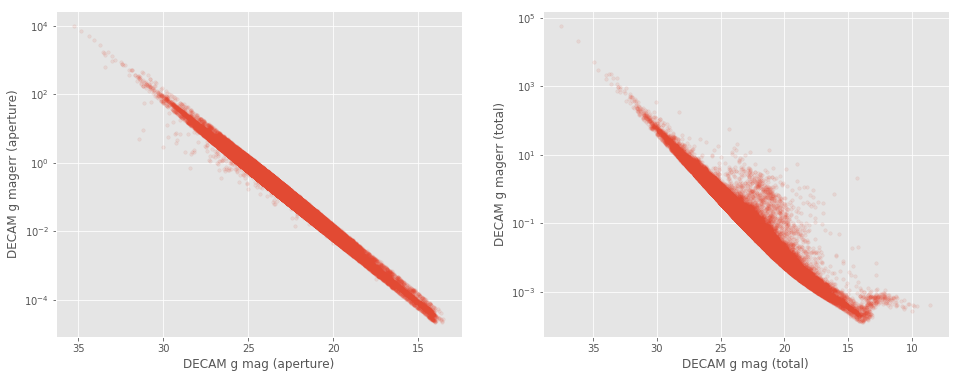

GPC1 g mag (aperture)
    Error max: 511397
    magerr > 10: Number of objects = 1148, min mag = 24.2
    magerr > 100: Number of objects = 91, min mag = 27.0
    magerr > 1000: Number of objects = 10, min mag = 29.5

GPC1 g mag (total)
    Error max: 26270
    magerr > 10: Number of objects = 1377, min mag = 23.2
    magerr > 100: Number of objects = 157, min mag = 26.4
    magerr > 1000: Number of objects = 15, min mag = 29.3



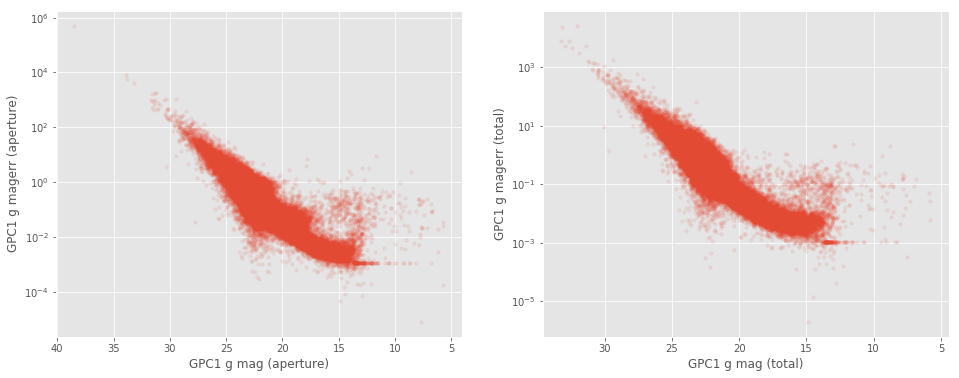

BASS g mag (aperture)
    Error max: 8129
    magerr > 10: Number of objects = 1343, min mag = 27.7
    magerr > 100: Number of objects = 129, min mag = 30.3
    magerr > 1000: Number of objects = 14, min mag = 33.4

BASS g mag (total)
    Error max: 94226
    magerr > 10: Number of objects = 1760, min mag = 19.4
    magerr > 100: Number of objects = 172, min mag = 25.9
    magerr > 1000: Number of objects = 23, min mag = 30.5



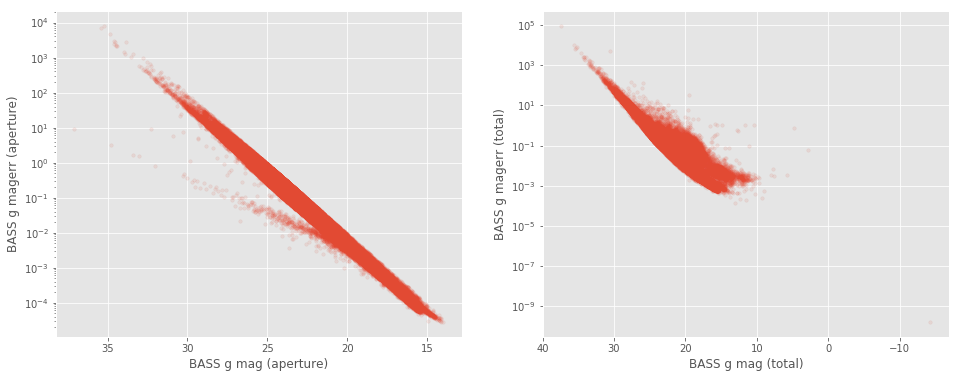

DECAM r mag (aperture)
    Error max: 4201
    magerr > 10: Number of objects = 315, min mag = 26.7
    magerr > 100: Number of objects = 24, min mag = 29.4
    magerr > 1000: Number of objects = 1, min mag = 33.8

DECAM r mag (total)
    Error max: 5964
    magerr > 10: Number of objects = 160, min mag = 23.0
    magerr > 100: Number of objects = 20, min mag = 28.9
    magerr > 1000: Number of objects = 1, min mag = 34.1



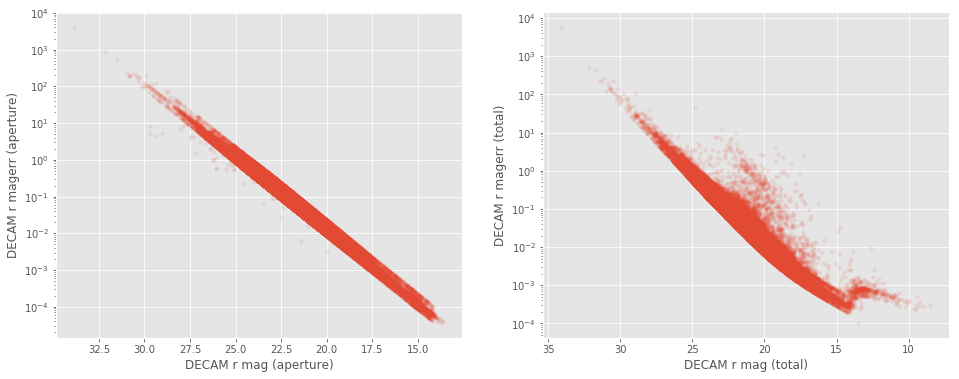

GPC1 r mag (aperture)
    Error max: 8788
    magerr > 10: Number of objects = 463, min mag = 20.9
    magerr > 100: Number of objects = 33, min mag = 27.9
    magerr > 1000: Number of objects = 2, min mag = 31.8

GPC1 r mag (total)
    Error max: 1495
    magerr > 10: Number of objects = 423, min mag = 21.0
    magerr > 100: Number of objects = 38, min mag = 22.5
    magerr > 1000: Number of objects = 1, min mag = 30.2



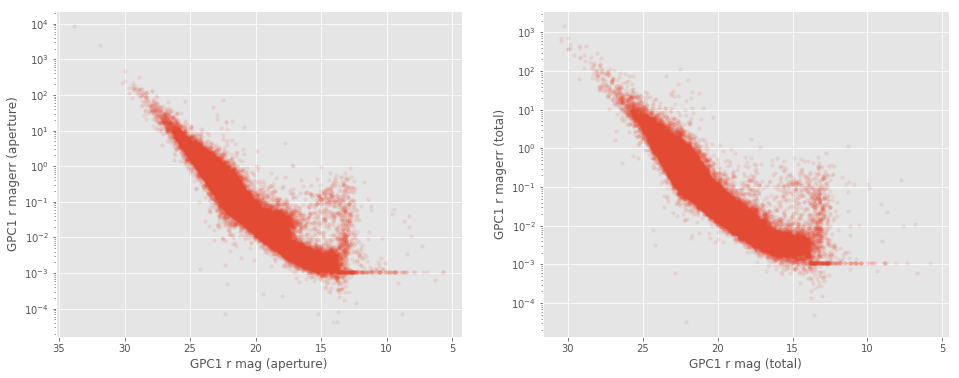

BASS r mag (aperture)
    Error max: 2284
    magerr > 10: Number of objects = 719, min mag = 27.1
    magerr > 100: Number of objects = 55, min mag = 29.6
    magerr > 1000: Number of objects = 1, min mag = 34.1

BASS r mag (total)
    Error max: 301347
    magerr > 10: Number of objects = 727, min mag = 23.0
    magerr > 100: Number of objects = 68, min mag = 29.4
    magerr > 1000: Number of objects = 9, min mag = 33.0



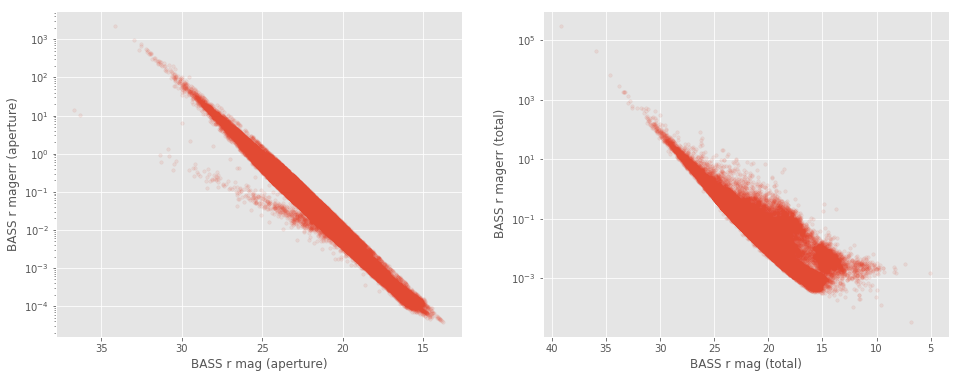

MOSAIC r mag (aperture)
    Error max: 1607
    magerr > 10: Number of objects = 47, min mag = 28.3
    magerr > 100: Number of objects = 5, min mag = 30.7
    magerr > 1000: Number of objects = 1, min mag = 34.1

MOSAIC r mag (total)
    Error max: 2133
    magerr > 10: Number of objects = 303, min mag = 26.4
    magerr > 100: Number of objects = 29, min mag = 30.3
    magerr > 1000: Number of objects = 3, min mag = 32.7



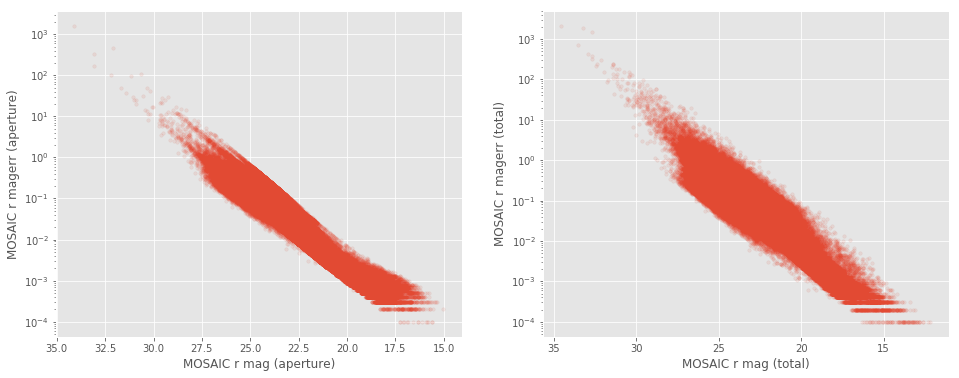

GPC1 i mag (aperture)
    Error max: 1944
    magerr > 10: Number of objects = 71, min mag = 24.7
    magerr > 100: Number of objects = 7, min mag = 27.6
    magerr > 1000: Number of objects = 1, min mag = 31.0

GPC1 i mag (total)
    Error max: 734
    magerr > 10: Number of objects = 103, min mag = 23.7
    magerr > 100: Number of objects = 14, min mag = 27.1
    magerr > 1000: Number of objects = 0, min mag = nan



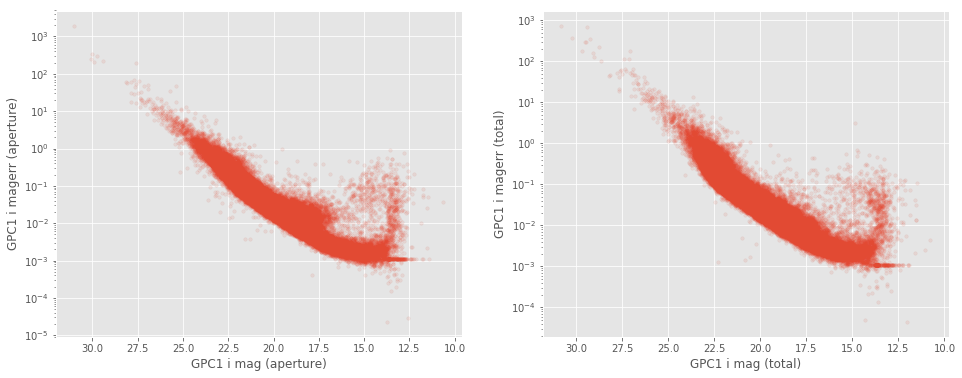

MOSAIC i mag (aperture)
    Error max: 3240
    magerr > 10: Number of objects = 68, min mag = 27.5
    magerr > 100: Number of objects = 11, min mag = 30.2
    magerr > 1000: Number of objects = 1, min mag = 35.2

MOSAIC i mag (total)
    Error max: 11891
    magerr > 10: Number of objects = 628, min mag = 25.4
    magerr > 100: Number of objects = 59, min mag = 27.9
    magerr > 1000: Number of objects = 5, min mag = 31.8



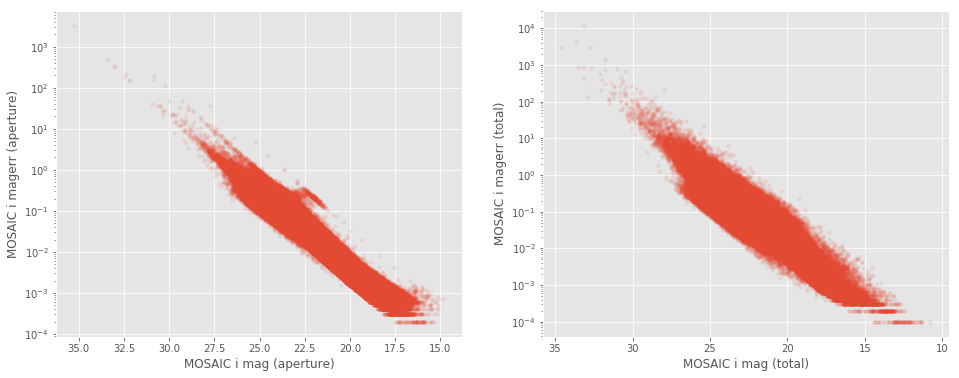

DECAM z mag (aperture)
    Error max: 27990
    magerr > 10: Number of objects = 617, min mag = 25.8
    magerr > 100: Number of objects = 58, min mag = 28.4
    magerr > 1000: Number of objects = 6, min mag = 31.5

DECAM z mag (total)
    Error max: 1941
    magerr > 10: Number of objects = 147, min mag = 21.4
    magerr > 100: Number of objects = 12, min mag = 24.6
    magerr > 1000: Number of objects = 3, min mag = 24.6



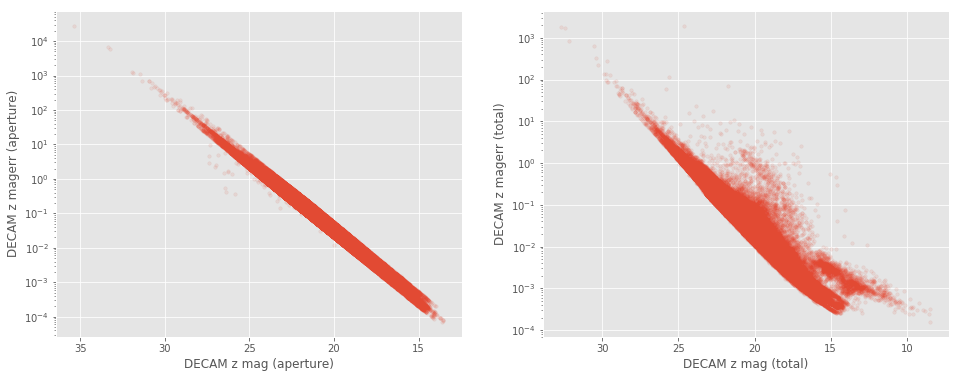

GPC1 z mag (aperture)
    Error max: 1105
    magerr > 10: Number of objects = 222, min mag = 22.2
    magerr > 100: Number of objects = 26, min mag = 26.3
    magerr > 1000: Number of objects = 1, min mag = 28.3

GPC1 z mag (total)
    Error max: 12217
    magerr > 10: Number of objects = 260, min mag = 22.3
    magerr > 100: Number of objects = 22, min mag = 25.9
    magerr > 1000: Number of objects = 1, min mag = 32.6



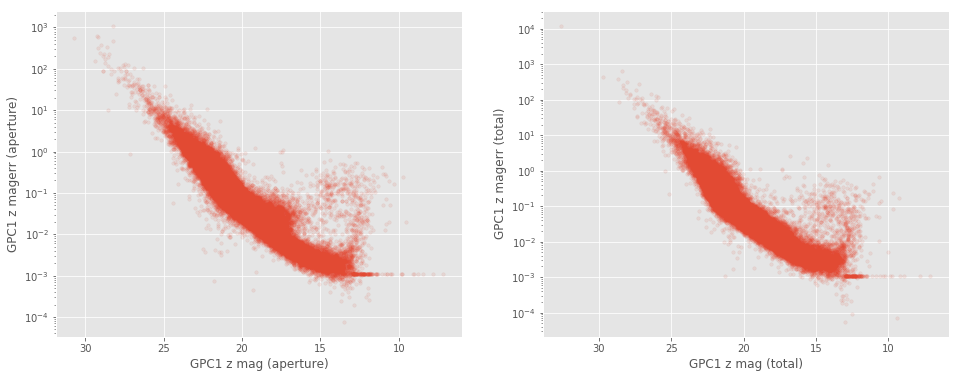

BASS z mag (aperture)
    Error max: 223366
    magerr > 10: Number of objects = 1218, min mag = 25.8
    magerr > 100: Number of objects = 112, min mag = 28.3
    magerr > 1000: Number of objects = 9, min mag = 31.8

BASS z mag (total)
    Error max: 1678
    magerr > 10: Number of objects = 304, min mag = 15.9
    magerr > 100: Number of objects = 35, min mag = 18.8
    magerr > 1000: Number of objects = 2, min mag = 33.1



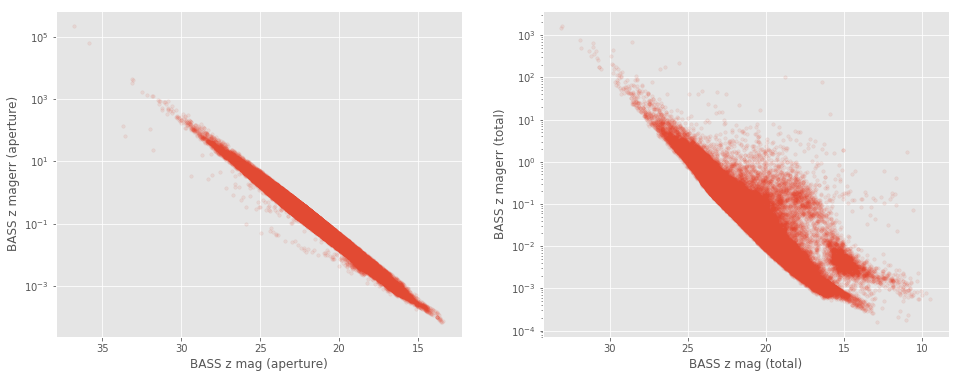

90prime z mag (aperture)
    Error max: 0
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

90prime z mag (total)
    Error max: 0
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



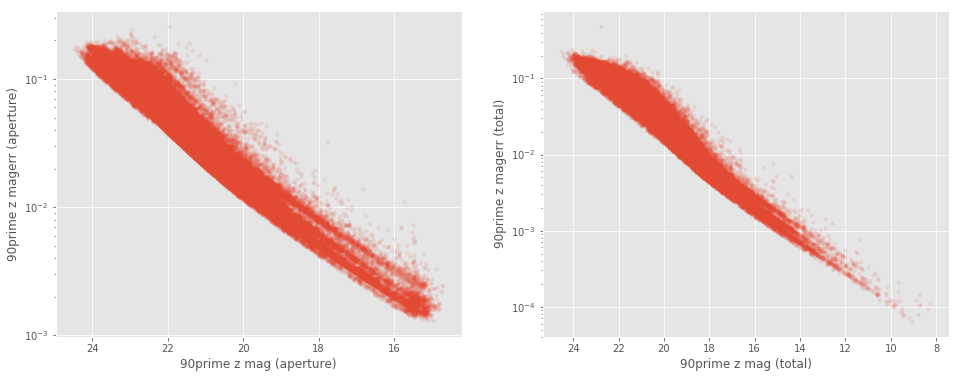

GPC1 y mag (aperture)
    Error max: 25781
    magerr > 10: Number of objects = 514, min mag = 13.3
    magerr > 100: Number of objects = 48, min mag = 23.8
    magerr > 1000: Number of objects = 7, min mag = 29.3

GPC1 y mag (total)
    Error max: 10397
    magerr > 10: Number of objects = 886, min mag = 11.6
    magerr > 100: Number of objects = 92, min mag = 25.1
    magerr > 1000: Number of objects = 5, min mag = 27.8



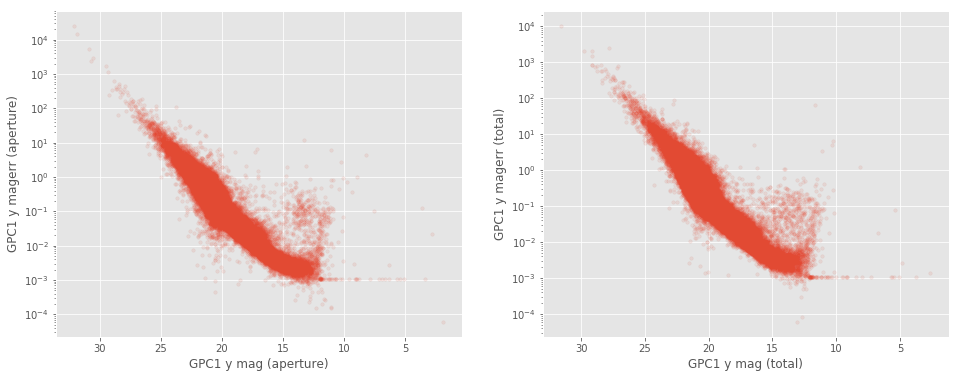

NEWFIRM J mag (aperture)
    Error max: 110
    magerr > 10: Number of objects = 7, min mag = 25.2
    magerr > 100: Number of objects = 1, min mag = 28.8
    magerr > 1000: Number of objects = 0, min mag = nan

NEWFIRM J mag (total)
    Error max: 653
    magerr > 10: Number of objects = 52, min mag = 23.8
    magerr > 100: Number of objects = 6, min mag = 26.9
    magerr > 1000: Number of objects = 0, min mag = nan



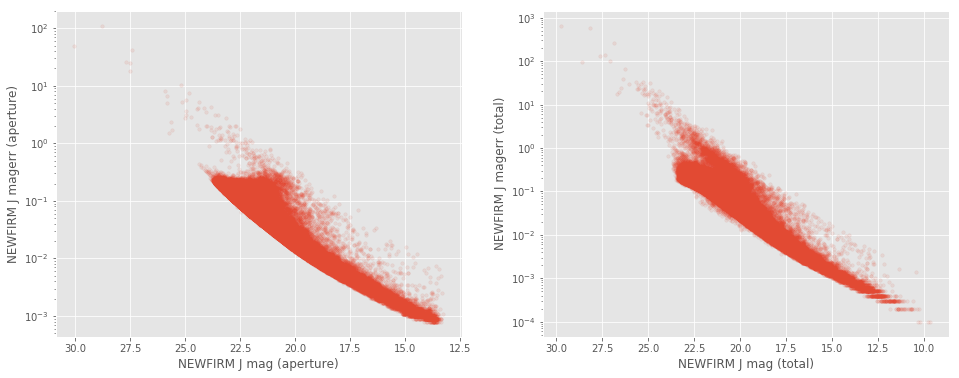

WFCAM J mag (aperture)
    Error max: 1
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

WFCAM J mag (total)
    Error max: 578
    magerr > 10: Number of objects = 12, min mag = 22.4
    magerr > 100: Number of objects = 1, min mag = 28.5
    magerr > 1000: Number of objects = 0, min mag = nan



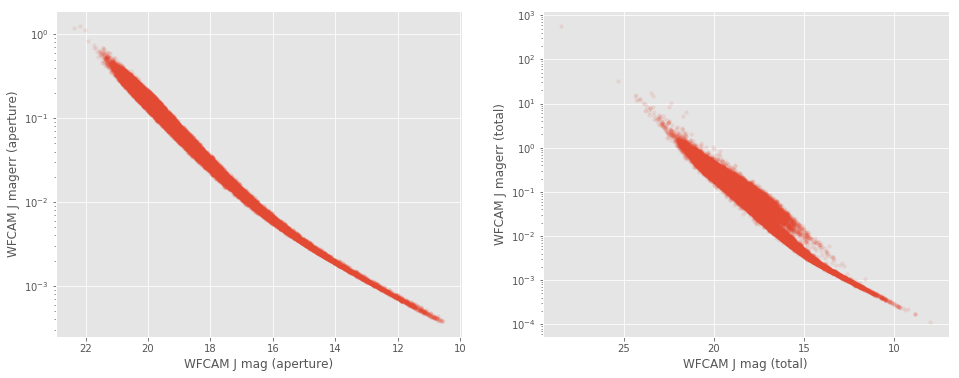

NEWFIRM H mag (aperture)
    Error max: 885
    magerr > 10: Number of objects = 136, min mag = 25.2
    magerr > 100: Number of objects = 9, min mag = 28.2
    magerr > 1000: Number of objects = 0, min mag = nan

NEWFIRM H mag (total)
    Error max: 44814
    magerr > 10: Number of objects = 579, min mag = 23.6
    magerr > 100: Number of objects = 35, min mag = 27.0
    magerr > 1000: Number of objects = 10, min mag = 30.0



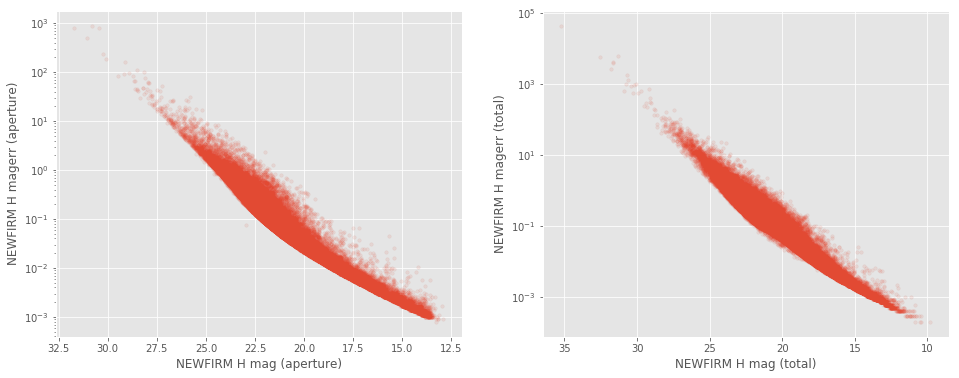

NEWFIRM K mag (aperture)
    Error max: 6450
    magerr > 10: Number of objects = 670, min mag = 24.4
    magerr > 100: Number of objects = 55, min mag = 27.4
    magerr > 1000: Number of objects = 2, min mag = 30.8

NEWFIRM K mag (total)
    Error max: 17840
    magerr > 10: Number of objects = 1985, min mag = 23.2
    magerr > 100: Number of objects = 211, min mag = 26.0
    magerr > 1000: Number of objects = 16, min mag = 29.3



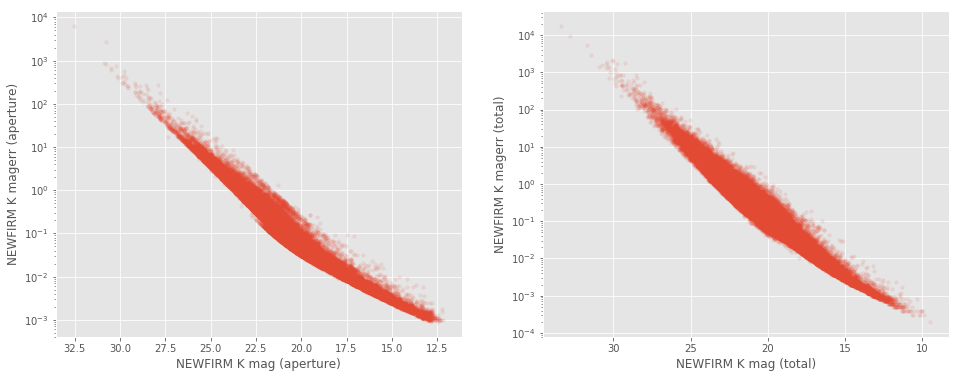

MOSAIC K mag (aperture)
    Error max: 88282
    magerr > 10: Number of objects = 2, min mag = 16.6
    magerr > 100: Number of objects = 2, min mag = 16.6
    magerr > 1000: Number of objects = 2, min mag = 16.6

MOSAIC K mag (total)
    Error max: 294614
    magerr > 10: Number of objects = 334, min mag = 9.4
    magerr > 100: Number of objects = 291, min mag = 12.1
    magerr > 1000: Number of objects = 147, min mag = 13.0



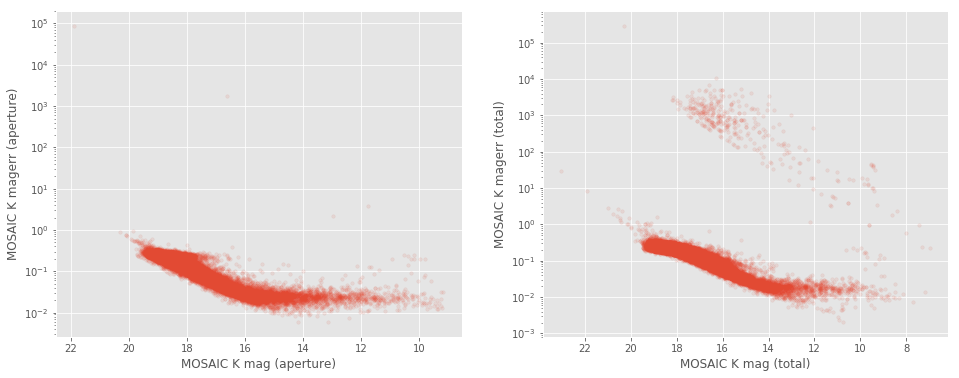

IRAC i1 mag (aperture)
    Error max: 30
    magerr > 10: Number of objects = 4, min mag = 27.3
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

IRAC i1 mag (total)
    Error max: 3831
    magerr > 10: Number of objects = 255, min mag = 24.6
    magerr > 100: Number of objects = 29, min mag = 28.0
    magerr > 1000: Number of objects = 6, min mag = 29.8



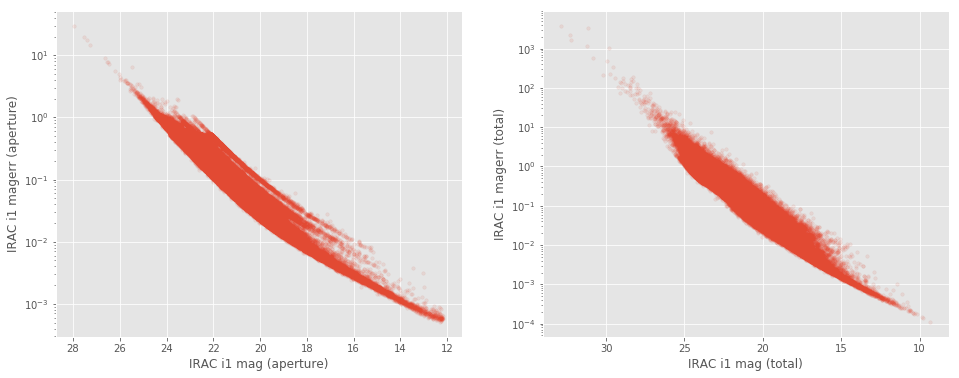

IRAC i2 mag (aperture)
    Error max: 15405
    magerr > 10: Number of objects = 21, min mag = 26.2
    magerr > 100: Number of objects = 4, min mag = 28.9
    magerr > 1000: Number of objects = 2, min mag = 31.1

IRAC i2 mag (total)
    Error max: 13126
    magerr > 10: Number of objects = 441, min mag = 23.5
    magerr > 100: Number of objects = 36, min mag = 27.6
    magerr > 1000: Number of objects = 6, min mag = 31.2



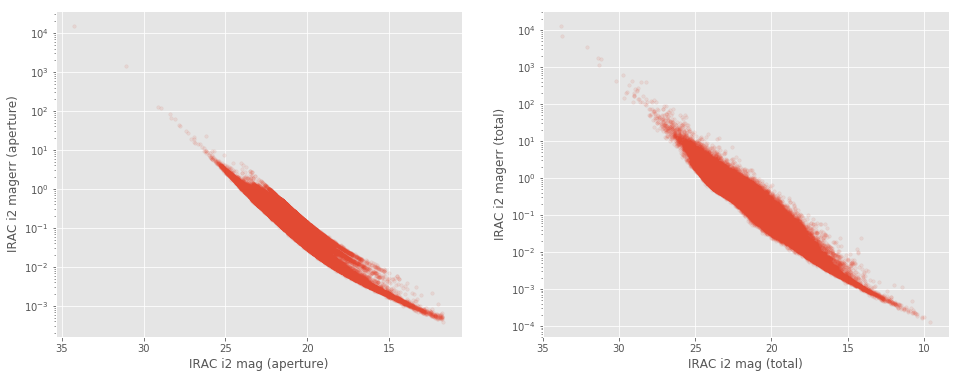

IRAC i3 mag (aperture)
    Error max: 73
    magerr > 10: Number of objects = 7, min mag = 24.6
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

IRAC i3 mag (total)
    Error max: 1186
    magerr > 10: Number of objects = 80, min mag = 23.1
    magerr > 100: Number of objects = 9, min mag = 26.4
    magerr > 1000: Number of objects = 1, min mag = 29.7



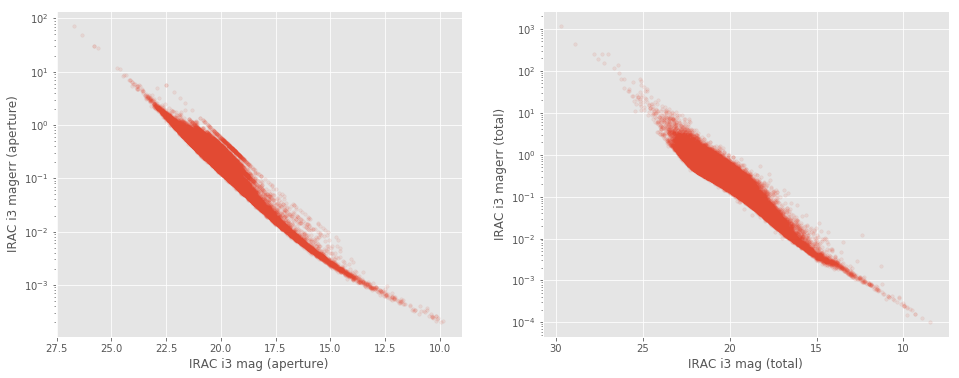

IRAC i4 mag (aperture)
    Error max: 46
    magerr > 10: Number of objects = 16, min mag = 24.5
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

IRAC i4 mag (total)
    Error max: 142
    magerr > 10: Number of objects = 37, min mag = 23.0
    magerr > 100: Number of objects = 2, min mag = 25.9
    magerr > 1000: Number of objects = 0, min mag = nan



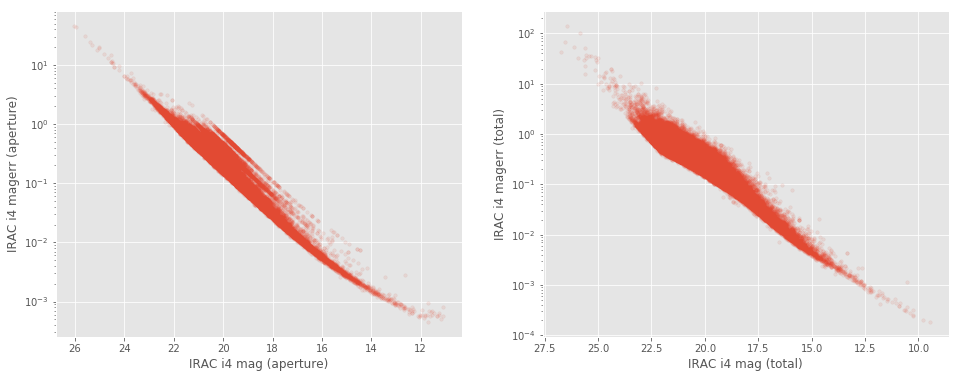

MOSAIC B mag (aperture)
    Error max: 136
    magerr > 10: Number of objects = 15, min mag = 30.7
    magerr > 100: Number of objects = 2, min mag = 32.5
    magerr > 1000: Number of objects = 0, min mag = nan

MOSAIC B mag (total)
    Error max: 858
    magerr > 10: Number of objects = 136, min mag = 27.8
    magerr > 100: Number of objects = 16, min mag = 31.8
    magerr > 1000: Number of objects = 0, min mag = nan



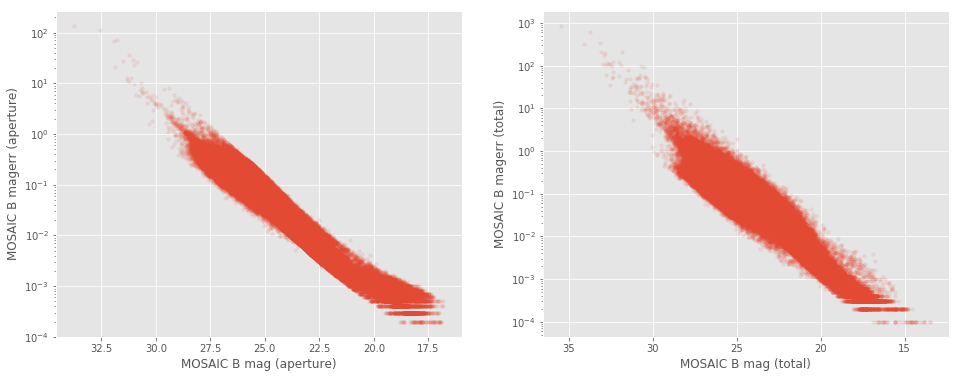

In [12]:
for mag in all_mags:
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
    
    basecol = mag.replace(" ", "_").lower()
    
    if basecol == "decam_g":
        savefig = True
    else:
        savefig=False
        
    col, ecol = "m_ap_{}".format(basecol), "merr_ap_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax1,
               labels=("{} mag (aperture)".format(mag), "{} magerr (aperture)".format(mag)), savefig=False)

    
    col, ecol = "m_{}".format(basecol), "merr_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax2,
               labels=("{} mag (total)".format(mag), "{} magerr (total)".format(mag)), savefig=savefig)
    
    display(fig)
    plt.close()


## 2/ Magnitude and error issues

In [13]:
def flag_mag(mask, x1, y1, x2, y2, mask2=None, x3=None, y3=None, mask3=None,
             labels1=("x", "y"), labels2=("x", "y"), labels3=("x", "y"), nb=2,
             savefig=False):

    if nb == 2 or (nb == 1 and x3 is None):
        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
    else:
        fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(16, 6))
    
    # mag vs magerr
    ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax1.scatter(x1, y1, marker='.', alpha=0.1, s=50)
    ax1.plot(x1[mask], y1[mask], 'b.')
    if mask2 is not None and nb >= 2:
        ax1.plot(x1[mask2], y1[mask2], 'g.')
    ax1.invert_xaxis()
    ax1.set_xlabel(labels1[0])
    ax1.set_ylabel(labels1[1])
    
    ### IRAC only ###
    if nb == 1:
        # IRAC mag
        ax2.set_yscale('log')    # to place before scatter to avoid issues
        ax2.scatter(x2, y2, marker='.', alpha=0.1, s=50)
        ax2.plot(x2[mask2], y2[mask2], 'b.')
        ax2.invert_xaxis()
        ax2.set_xlabel(labels2[0])
        ax2.set_ylabel(labels2[1])
        
    if nb == 1 and x3 is not None:
        # IRAC mag with i3
        ax3.set_yscale('log')    # to place before scatter to avoid issues
        ax3.scatter(x3, y3, marker='.', alpha=0.1, s=50)
        ax3.plot(x3[mask3], y3[mask3], 'b.')
        ax3.invert_xaxis()
        ax3.set_xlabel(labels3[0])
        ax3.set_ylabel(labels3[1])
    ###          ###
    
    # Comparing magnitudes
    if nb >= 2:
        ax2.scatter(x2, y2, marker='.', alpha=0.1, s=50)
        ax2.plot(x2[mask], y2[mask], 'b.')
        if mask2 is not None:
            ax2.plot(x2[mask2], y2[mask2], 'g.')
        ax2.invert_xaxis()
        ax2.invert_yaxis()
        ax2.set_xlabel(labels2[0])
        ax2.set_ylabel(labels2[1])
    
    if nb >= 3:
        ax3.scatter(x3, y3, marker='.', alpha=0.1, s=50)
        ax3.plot(x3[mask], y3[mask], 'b.')
        if mask2 is not None:
            ax3.plot(x3[mask2], y3[mask2], 'g.')
        ax3.invert_xaxis()
        ax3.invert_yaxis()
        ax3.set_xlabel(labels3[0])
        ax3.set_ylabel(labels3[1])
    
    # Save ex. fig
    if savefig:
        survey_label = ((labels1[0].replace(" ", "_")).replace("(", "")).replace(")", "")
        if "GPC1 " in labels1[0]:
            figname = field + "_gpc1Issues_" + survey_label + ".png"
        elif "DECam" in labels1[0]:
            figname = field + "_decamIssues_" + survey_label + ".png"
        elif "IRAC" in labels1[0]:
            figname = field + "_iracIssues_i1_i2.png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')
        
    display(fig)
    plt.close()

### 2.a Pan-STARRS Aperture magnitude

GPC1 g
   Number of flagged objects: 88


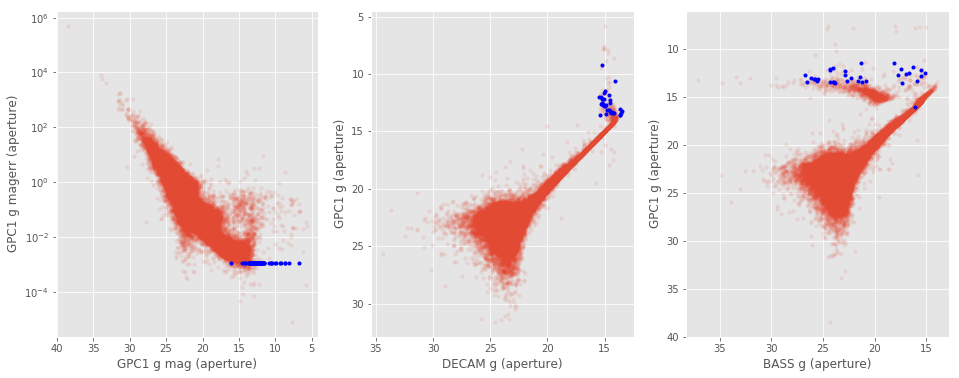

GPC1 r
   Number of flagged objects: 167


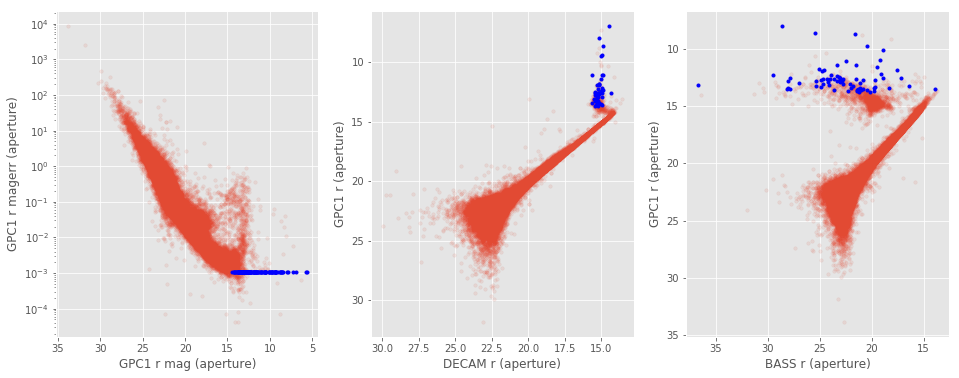

GPC1 i
   Number of flagged objects: 140


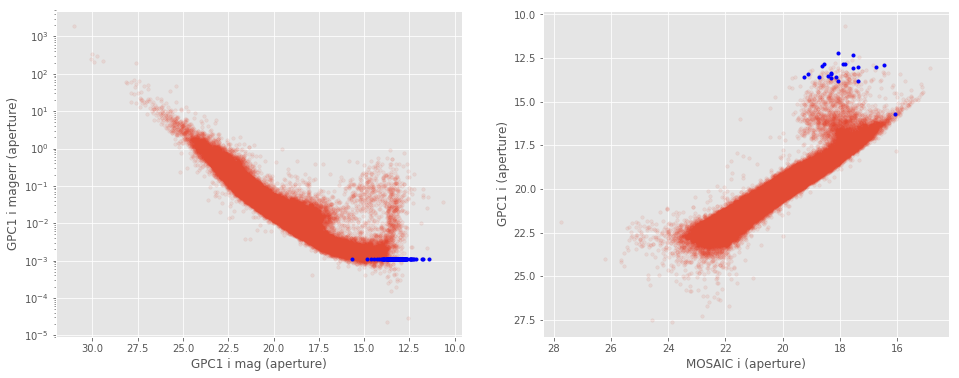

GPC1 z
   Number of flagged objects: 132


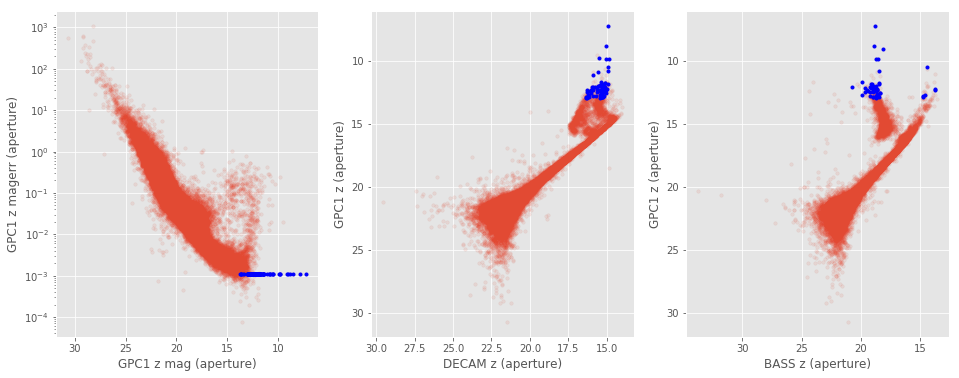

In [17]:
## Pan-STARRS forced photometry catalogue 
ps1_err = 0.0010860000038519502

bands = ['g', 'r', 'i', 'z']

for i, surveys in enumerate([g_bands, r_bands, i_bands, z_bands]):
    surveys.insert(0, surveys.pop(surveys.index('GPC1 '+ bands[i])))
    print(surveys[0])
    
    basecol1, basecol2 = surveys[0].replace(" ", "_").lower(), surveys[1].replace(" ", "_").lower()
    col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
    ecol1 = "merr_ap_{}".format(basecol1)
    
    if len(surveys) >= 3:
        basecol3 = surveys[2].replace(" ", "_").lower()
        col3 = "m_ap_{}".format(basecol3)
        x3, y3 = master_catalogue[col3], master_catalogue[col1]
        labels3 = ("{} (aperture)".format(surveys[2]), "{} (aperture)".format(surveys[0]))
    else:
        x3, y3, labels3 = None, None, None
        
    if basecol1 == 'gpc1_g':
        savefig = True
    else:
        savefig = False

        
    mask = np.where(master_catalogue[ecol1] == ps1_err)    
    print ('   Number of flagged objects:', len(master_catalogue[ecol1][mask]))

    flag_mag(mask, master_catalogue[col1], master_catalogue[ecol1],
                    master_catalogue[col2], master_catalogue[col1], 
                    x3=x3, y3=y3,
                    labels1=("{} mag (aperture)".format(surveys[0]), "{} magerr (aperture)".format(surveys[0])),
                    labels2=("{} (aperture)".format(surveys[1]), "{} (aperture)".format(surveys[0])),
                    labels3=labels3, nb=len(surveys), savefig=savefig)

### 2.c IRAC Aperture magnitude

IRAC i1: Number of flagged objects: 0
IRAC i2: Number of flagged objects: 0
IRAC i3: Number of flagged objects: 0


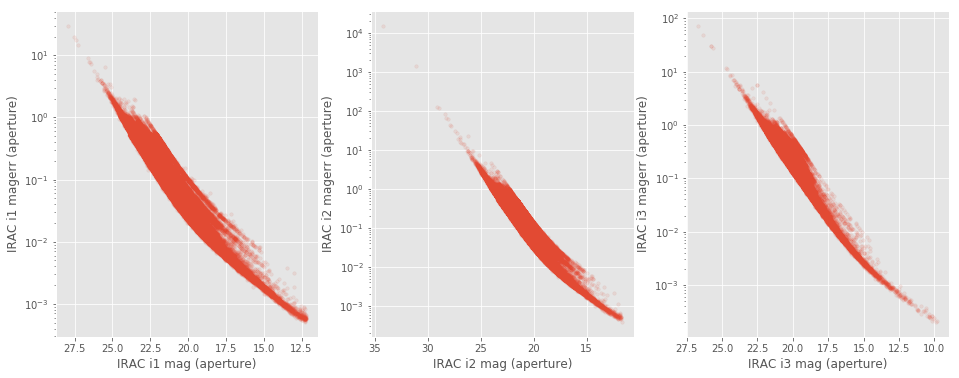

In [19]:
irac_mag = 3.9000000001085695

bands = ['IRAC i1', 'IRAC i2', 'IRAC i3']
    
basecol1, basecol2, basecol3 = bands[0].replace(" ", "_").lower(), bands[1].replace(" ", "_").lower(), bands[2].replace(" ", "_").lower()
col1, col2, col3 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2), "m_ap_{}".format(basecol3)
ecol1, ecol2, ecol3 = "merr_ap_{}".format(basecol1), "merr_ap_{}".format(basecol2), "merr_ap_{}".format(basecol3)
    
mask1 = np.where(master_catalogue[col1] == irac_mag)[0]   
print ('IRAC i1: Number of flagged objects:', len(master_catalogue[col1][mask1]))

mask2 = np.where(master_catalogue[col2] == irac_mag)[0]  
print ('IRAC i2: Number of flagged objects:', len(master_catalogue[col2][mask2]))

mask3 = np.where(master_catalogue[col3] == irac_mag)[0]  
print ('IRAC i3: Number of flagged objects:', len(master_catalogue[col3][mask3]))

flag_mag(mask1, master_catalogue[col1], master_catalogue[ecol1],
         master_catalogue[col2], master_catalogue[ecol2], mask2=mask2,
         x3=master_catalogue[col3], y3=master_catalogue[ecol3], mask3=mask3,
         labels1=("{} mag (aperture)".format(bands[0]), "{} magerr (aperture)".format(bands[0])),
         labels2=("{} mag (aperture)".format(bands[1]), "{} magerr (aperture)".format(bands[1])),
         labels3=("{} mag (aperture)".format(bands[2]), "{} magerr (aperture)".format(bands[2])),
         nb=1, savefig=True)

## 3/ Outliers

$$chi^2 = \frac{(mag_{1}-mag_{2})^2}{magerr_{1}^2 + magerr_{2}^2}$$ 
<br>
__Interquartile range (IQR) and outliers:__<br>
We consider as outliers objects which have a high $chi^2$, about $5\sigma$ away from the mean.<br>
$25th, 75th \;percentile = 0.6745\sigma$<br>
$IQR = (75th \;percentile - 25th \;percentile) = 0.6745\sigma * 2 = 1.349\sigma$<br>
$75th \;percentile + 3.2\times IQR = 0.6745\sigma + 3.2\times1.349\sigma = 5\sigma$
<br><br>
$$outliers == [chi^2 >  (75th \;percentile + 3.2\times (75th \;percentile - 25th \;percentile))]$$
<br><br>
__NB:__<br>
Bright sources tend to have their errors underestimated with values as low as $10^{-6}$, which is unrealistic. So to avoid high $chi^2$ due to unrealistic small errors, we clip the error to get a minimum value of 0.1% (i.e. all errors smaller then $10^{-3}$ are set to $10^{-3}$).

In [20]:
def outliers(x, y, xerr, yerr, labels=["x", "y"], savefig=False):
    
    import matplotlib
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(xerr) & np.isfinite(yerr)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    xerr = np.copy(xerr[mask])
    yerr = np.copy(yerr[mask])
    
    # mag1 - mag2
    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    # Set the minimum error to 10^-3
    np.clip(xerr, 1e-3, np.max(xerr), out=xerr)
    np.clip(yerr, 1e-3, np.max(yerr), out=yerr)

    # Median, Median absolute deviation and 1% and 99% percentiles
    diff_median = np.median(diff)
    diff_mad = np.median(np.abs(diff - diff_median))
    diff_1p, diff_99p = np.percentile(diff, [1., 99.])
    diff_25p, diff_75p = np.percentile(diff, [25., 75.])
    
    
    diff_label = "{} - {}".format(y_label, x_label)

    print("{} ({} sources):".format(diff_label, len(x)))
    print("- Median: {:.2f}".format(diff_median))
    print("- Median Absolute Deviation: {:.2f}".format(diff_mad))
    print("- 1% percentile: {}".format(diff_1p))
    print("- 99% percentile: {}".format(diff_99p))

    
    # Chi2 (Normalized difference)   
    ichi2 = np.power(diff, 2) / (np.power(xerr, 2) + np.power(yerr, 2))
    
    # Use only non-null values of ichi2
    mask2 = ichi2 != 0.0
    diff, ichi2 = np.copy(diff[mask2]), np.copy(ichi2[mask2])
    x, y, xerr, yerr = np.copy(x[mask2]), np.copy(y[mask2]), np.copy(xerr[mask2]), np.copy(yerr[mask2])

    # Outliers (5sigma)
    log_ichi2_25p, log_ichi2_75p = np.percentile(np.log10(ichi2), [25., 75.])
    out_lim = log_ichi2_75p + 3.2*abs(log_ichi2_25p-log_ichi2_75p)
    
    outliers = np.log10(ichi2) > out_lim 
    nb_outliers = len(x[outliers])
    
    print("Outliers separation: log(chi2) = {:.2f}".format(out_lim))
    print("Number of outliers: {}".format(nb_outliers))

    print("")

    # Comparing mag
    ax1.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax1.scatter(x[outliers], y[outliers], marker='.', c='b', alpha=0.3, s=50, label='Outliers ({})'.format(nb_outliers))
    min_val = np.min(np.r_[x, y])
    max_val = np.max(np.r_[x, y])
    ax1.autoscale(False)
    ax1.plot([min_val, max_val], [min_val, max_val], "k:")
    ax1.invert_xaxis()
    ax1.invert_yaxis()
    ax1.set_xlabel(x_label)
    ax1.set_ylabel(y_label)
    ax1.legend(loc='lower right', numpoints=1)
    

    # Chi2 vs Diff
    #ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax2.scatter(diff, np.log10(ichi2), marker='.', alpha=0.1, s=50)
    if nb_outliers != 0:
        ax2.scatter(diff[outliers], np.log10(ichi2[outliers]), marker='.', alpha=0.3, s=50, color='b',\
                    label='Outliers ({})'.format(nb_outliers))
    ax2.axhline(out_lim, color='grey', linestyle=':')
    ax2.set_xlabel(diff_label)
    ax2.set_ylabel('log(chi2)')
    ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(np.log10(ichi2), ax=ax3, bins='knuth', facecolor='red', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    if nb_outliers > 3:
        n, bins, patches = vz.hist(np.log10(ichi2[outliers]), ax=ax3, bins='knuth', facecolor='b', lw = 2, alpha=0.7,\
                                   orientation="horizontal")
    ax3.axhline(out_lim, color='grey', linestyle=':')
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_outliers_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

DECAM g (aperture) - GPC1 g (aperture) (86414 sources):
- Median: 0.11
- Median Absolute Deviation: 0.27
- 1% percentile: -2.129623432159424
- 99% percentile: 3.1636921691894475
Outliers separation: log(chi2) = 4.92
Number of outliers: 77



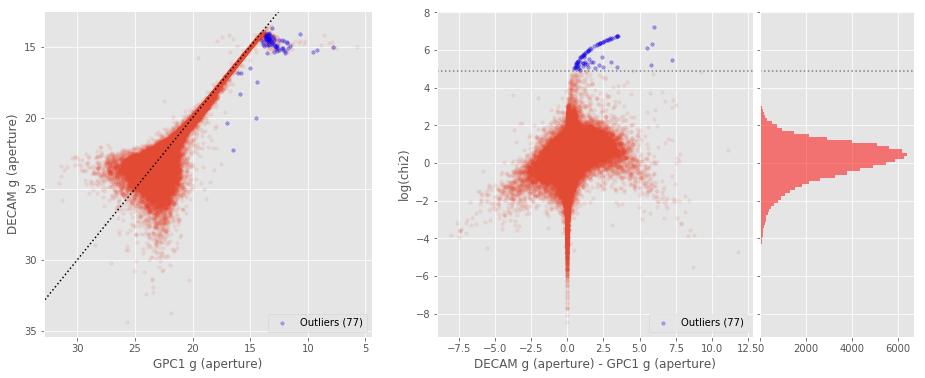

DECAM g (total) - GPC1 g (total) (86441 sources):
- Median: 0.03
- Median Absolute Deviation: 0.27
- 1% percentile: -1.5935642242431642
- 99% percentile: 3.554932403564457
Outliers separation: log(chi2) = 5.07
Number of outliers: 14



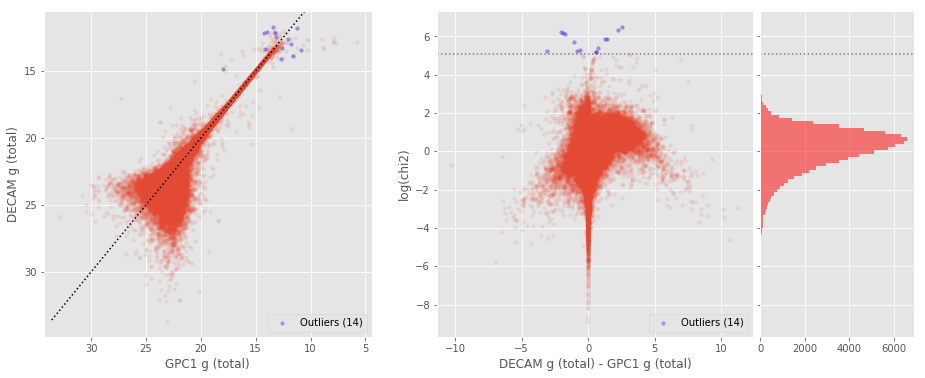

BASS g (aperture) - GPC1 g (aperture) (182873 sources):
- Median: 0.13
- Median Absolute Deviation: 0.27
- 1% percentile: -2.1558848571777345
- 99% percentile: 3.624149322509765
Outliers separation: log(chi2) = 5.49
Number of outliers: 806



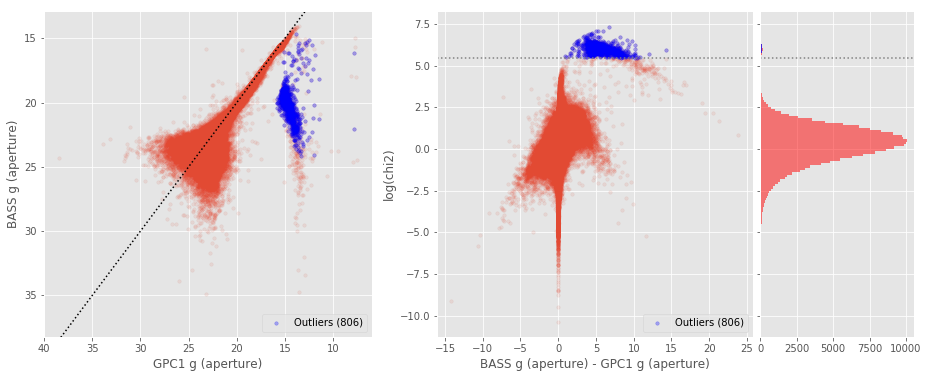

BASS g (total) - GPC1 g (total) (184266 sources):
- Median: 0.01
- Median Absolute Deviation: 0.27
- 1% percentile: -1.7584948539733887
- 99% percentile: 3.16856803894043
Outliers separation: log(chi2) = 5.06
Number of outliers: 82



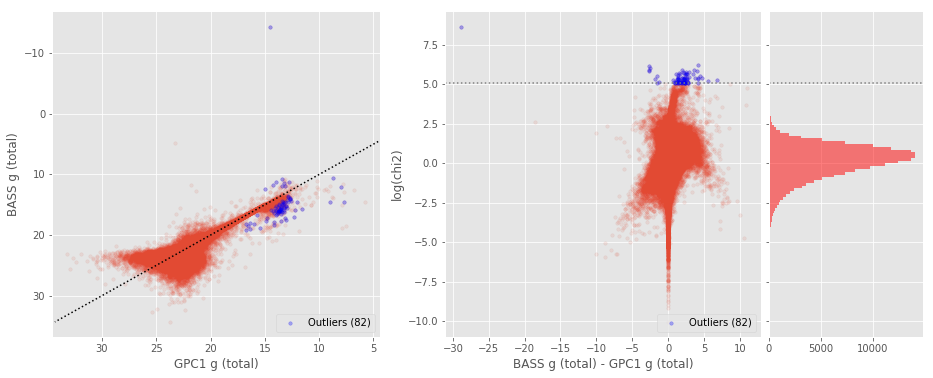

BASS g (aperture) - DECAM g (aperture) (197271 sources):
- Median: 0.01
- Median Absolute Deviation: 0.18
- 1% percentile: -1.9024787902832032
- 99% percentile: 1.915562438964841
Outliers separation: log(chi2) = 3.96
Number of outliers: 724



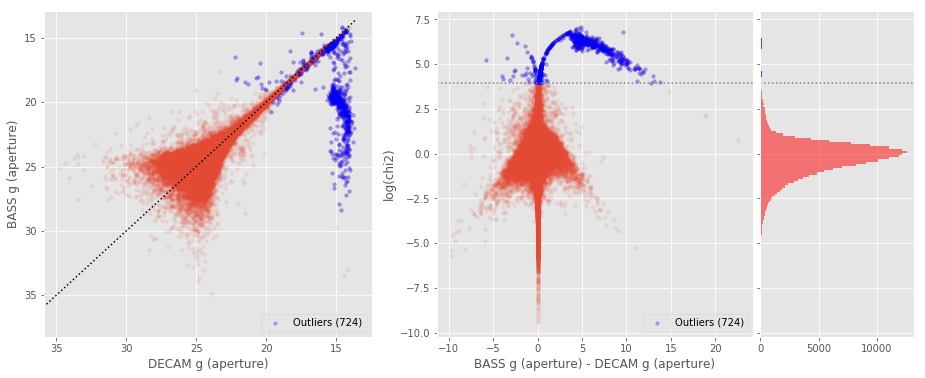

BASS g (total) - DECAM g (total) (196776 sources):
- Median: -0.08
- Median Absolute Deviation: 0.18
- 1% percentile: -2.300769805908203
- 99% percentile: 1.2545394897460938
Outliers separation: log(chi2) = 4.00
Number of outliers: 504



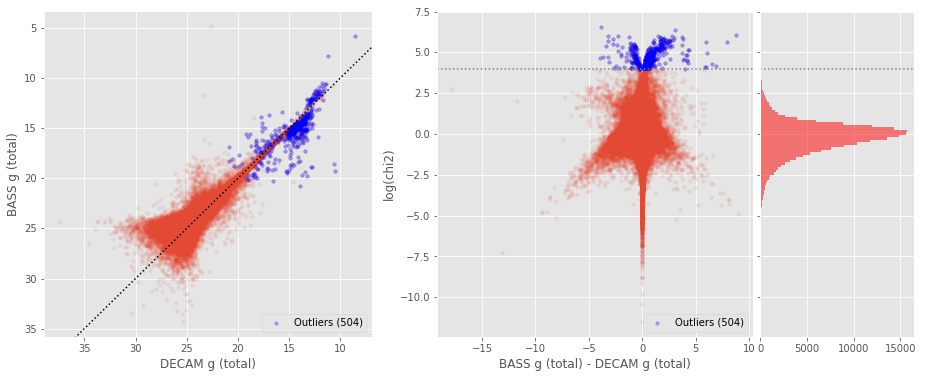

DECAM r (aperture) - GPC1 r (aperture) (90473 sources):
- Median: -0.07
- Median Absolute Deviation: 0.18
- 1% percentile: -1.7460657501220702
- 99% percentile: 1.5504988861083981
Outliers separation: log(chi2) = 4.83
Number of outliers: 274



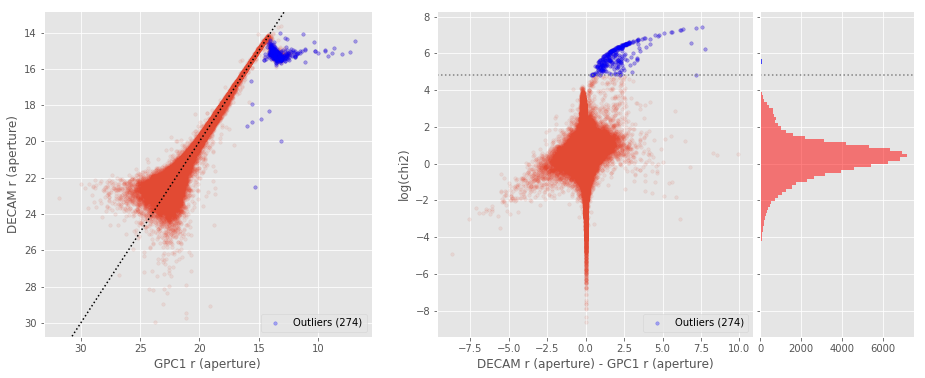

DECAM r (total) - GPC1 r (total) (90717 sources):
- Median: -0.17
- Median Absolute Deviation: 0.16
- 1% percentile: -1.3463243865966796
- 99% percentile: 1.5266695404052713
Outliers separation: log(chi2) = 5.54
Number of outliers: 17



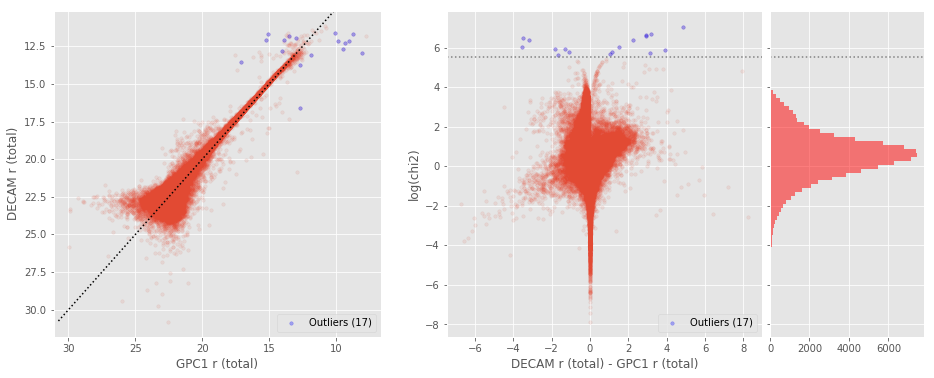

BASS r (aperture) - GPC1 r (aperture) (193752 sources):
- Median: 0.01
- Median Absolute Deviation: 0.19
- 1% percentile: -1.6478734016418457
- 99% percentile: 2.0846044635772616
Outliers separation: log(chi2) = 5.17
Number of outliers: 1264



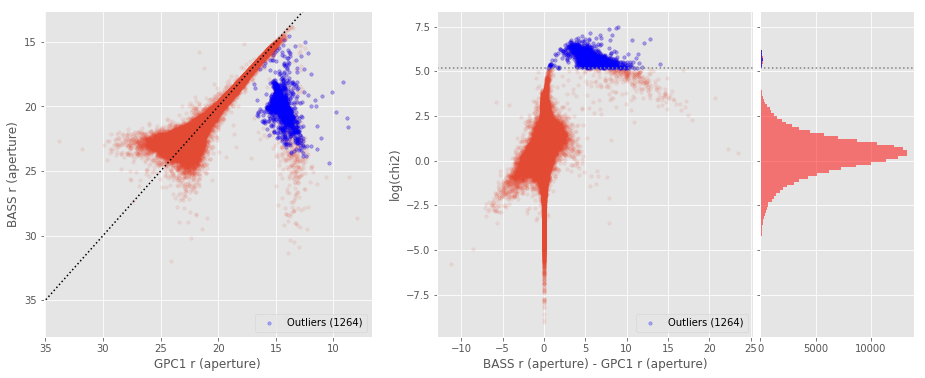

BASS r (total) - GPC1 r (total) (194548 sources):
- Median: -0.16
- Median Absolute Deviation: 0.15
- 1% percentile: -1.4110986709594726
- 99% percentile: 1.466648483276367
Outliers separation: log(chi2) = 5.51
Number of outliers: 38



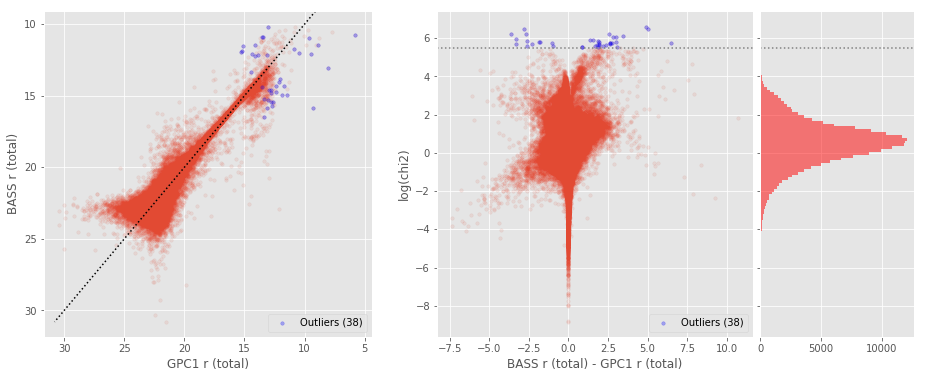

MOSAIC r (aperture) - GPC1 r (aperture) (131358 sources):
- Median: 0.32
- Median Absolute Deviation: 0.30
- 1% percentile: -1.5543725476989732
- 99% percentile: 1.9533455380248914
Outliers separation: log(chi2) = 7.09
Number of outliers: 19



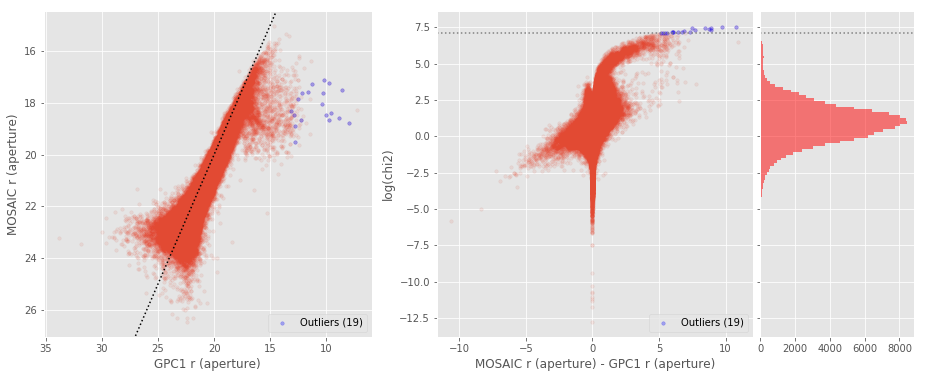

MOSAIC r (total) - GPC1 r (total) (131660 sources):
- Median: -0.42
- Median Absolute Deviation: 0.18
- 1% percentile: -1.9438456686096197
- 99% percentile: 1.3285997677612298
Outliers separation: log(chi2) = 5.98
Number of outliers: 144



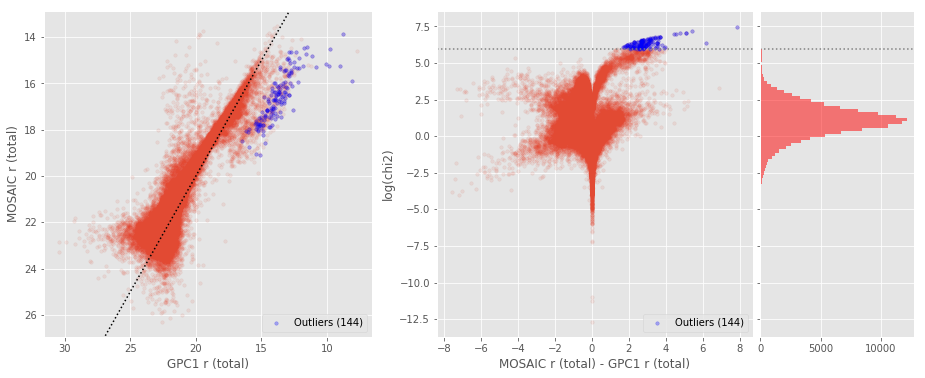

BASS r (aperture) - DECAM r (aperture) (206557 sources):
- Median: 0.03
- Median Absolute Deviation: 0.14
- 1% percentile: -1.3027259826660156
- 99% percentile: 1.7100755310058595
Outliers separation: log(chi2) = 4.12
Number of outliers: 1083



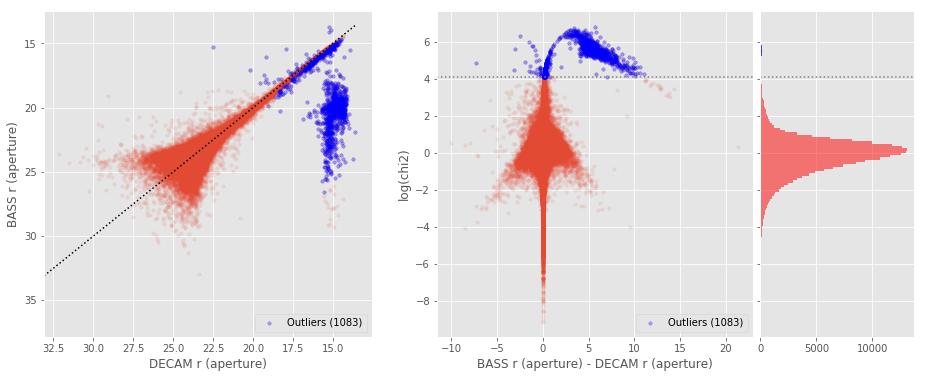

BASS r (total) - DECAM r (total) (208081 sources):
- Median: -0.00
- Median Absolute Deviation: 0.14
- 1% percentile: -1.2540557861328123
- 99% percentile: 0.9731430053710977
Outliers separation: log(chi2) = 4.33
Number of outliers: 338



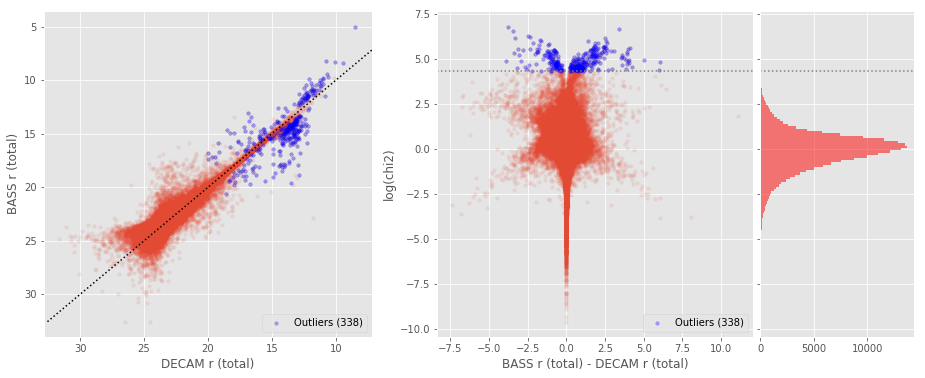

MOSAIC r (aperture) - DECAM r (aperture) (170199 sources):
- Median: 0.34
- Median Absolute Deviation: 0.23
- 1% percentile: -1.273856057128907
- 99% percentile: 1.1829542102050776
Outliers separation: log(chi2) = 7.00
Number of outliers: 1



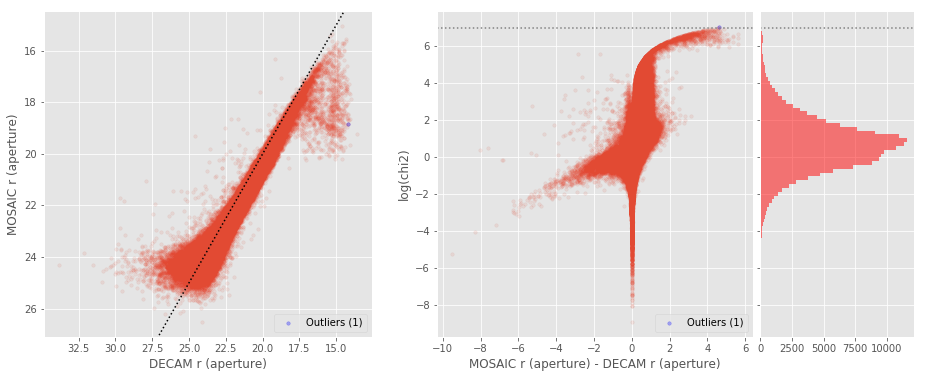

MOSAIC r (total) - DECAM r (total) (170686 sources):
- Median: -0.31
- Median Absolute Deviation: 0.16
- 1% percentile: -1.9626963769531256
- 99% percentile: 0.5849587255859365
Outliers separation: log(chi2) = 5.16
Number of outliers: 735



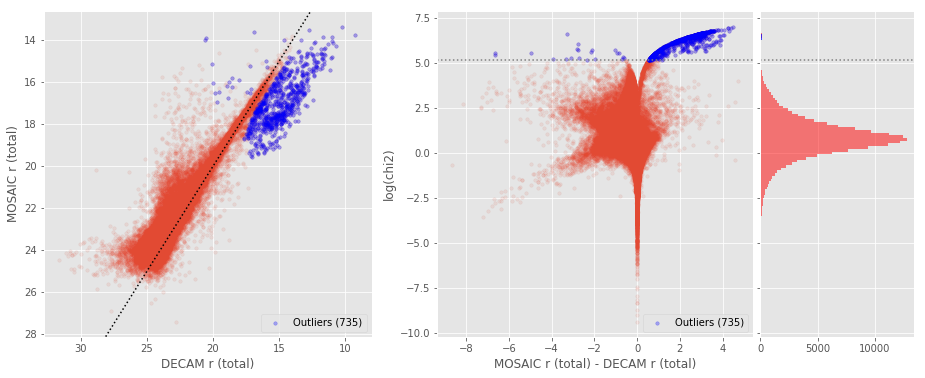

MOSAIC r (aperture) - BASS r (aperture) (343957 sources):
- Median: 0.26
- Median Absolute Deviation: 0.24
- 1% percentile: -1.5048314084472654
- 99% percentile: 1.1905264020996087
Outliers separation: log(chi2) = 7.13
Number of outliers: 0



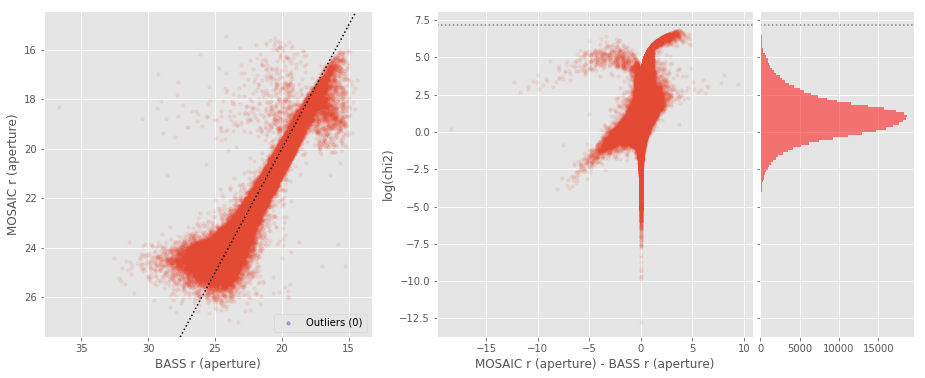

MOSAIC r (total) - BASS r (total) (346808 sources):
- Median: -0.29
- Median Absolute Deviation: 0.16
- 1% percentile: -1.9414329913330073
- 99% percentile: 0.7985939500732392
Outliers separation: log(chi2) = 5.73
Number of outliers: 447



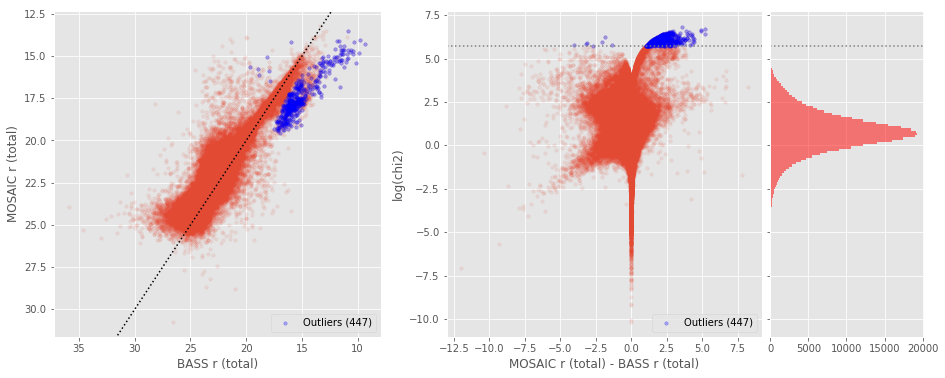

MOSAIC i (aperture) - GPC1 i (aperture) (140658 sources):
- Median: 0.05
- Median Absolute Deviation: 0.22
- 1% percentile: -0.8175293390808115
- 99% percentile: 1.5236310905456432
Outliers separation: log(chi2) = 6.78
Number of outliers: 25



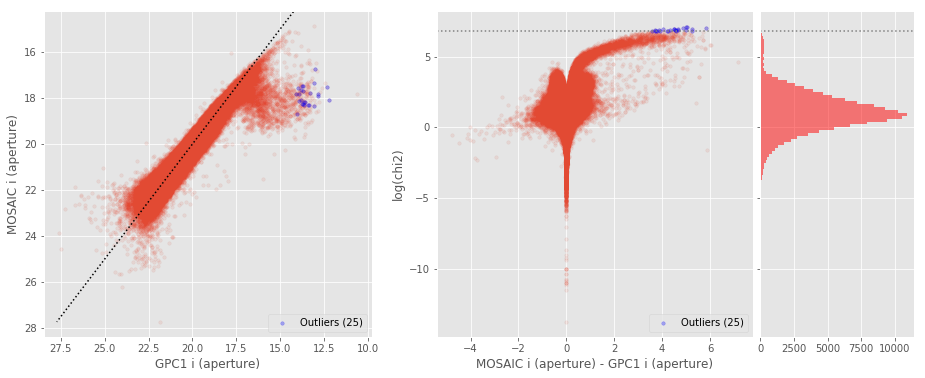

MOSAIC i (total) - GPC1 i (total) (140588 sources):
- Median: -0.70
- Median Absolute Deviation: 0.13
- 1% percentile: -2.8845257424011237
- 99% percentile: 0.5245688302917544
Outliers separation: log(chi2) = 6.08
Number of outliers: 69



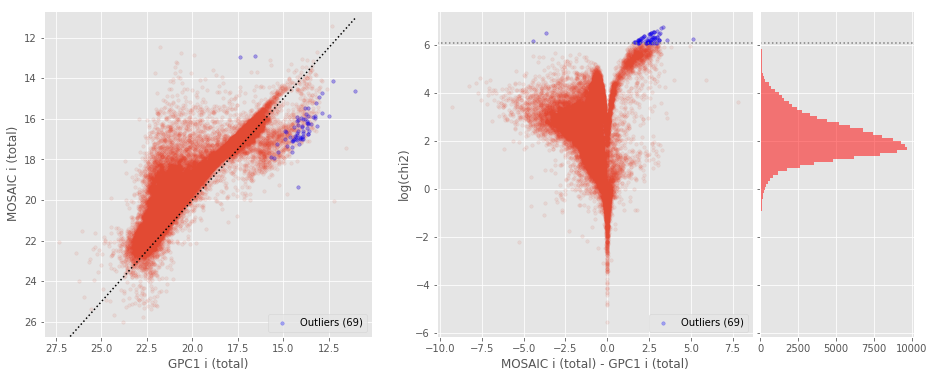

DECAM z (aperture) - GPC1 z (aperture) (155664 sources):
- Median: -0.13
- Median Absolute Deviation: 0.13
- 1% percentile: -1.2986002159118653
- 99% percentile: 1.5465093803405685
Outliers separation: log(chi2) = 4.95
Number of outliers: 1342



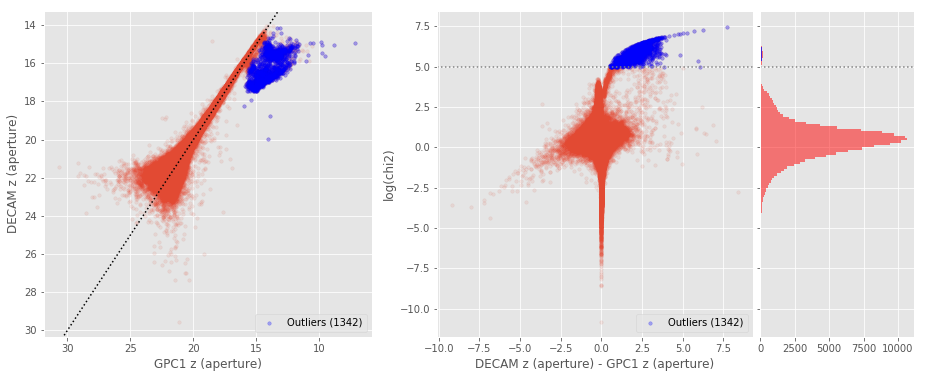

DECAM z (total) - GPC1 z (total) (155649 sources):
- Median: -0.25
- Median Absolute Deviation: 0.14
- 1% percentile: -1.3092887878417967
- 99% percentile: 0.9159954833984361
Outliers separation: log(chi2) = 5.84
Number of outliers: 20



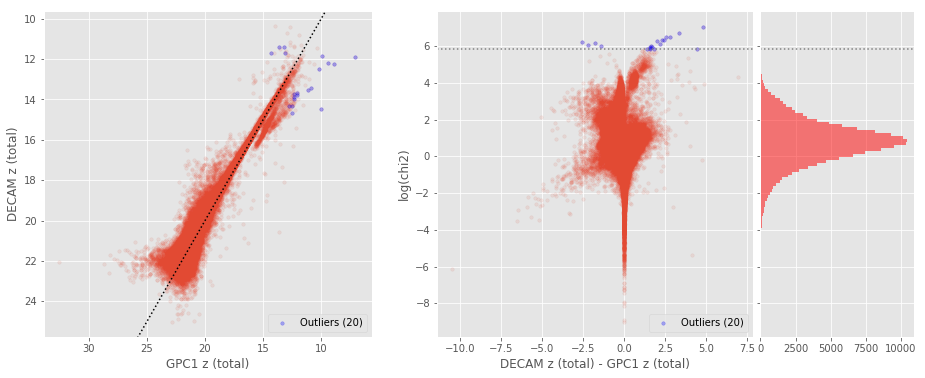

BASS z (aperture) - GPC1 z (aperture) (124681 sources):
- Median: -0.10
- Median Absolute Deviation: 0.14
- 1% percentile: -1.2721107482910157
- 99% percentile: 2.941773223876948
Outliers separation: log(chi2) = 4.91
Number of outliers: 1844



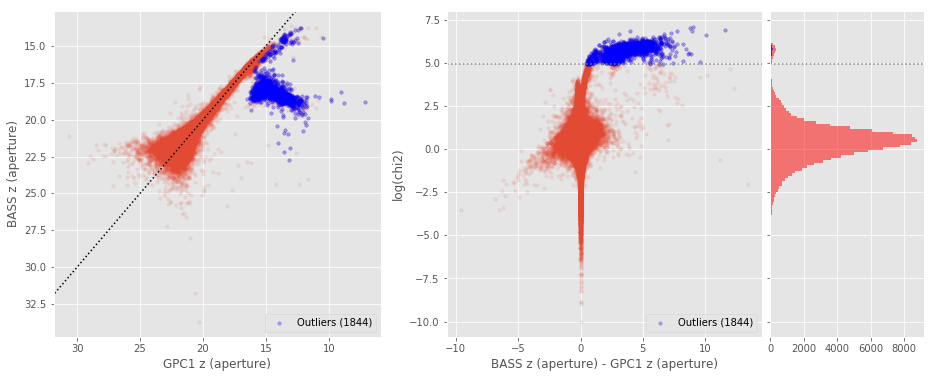

BASS z (total) - GPC1 z (total) (124729 sources):
- Median: -0.28
- Median Absolute Deviation: 0.14
- 1% percentile: -1.3286592864990234
- 99% percentile: 0.979087142944336
Outliers separation: log(chi2) = 5.79
Number of outliers: 18



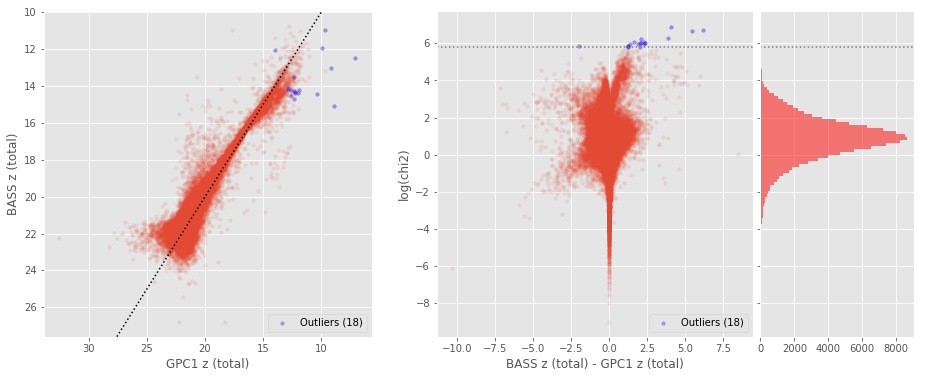

90prime z (aperture) - GPC1 z (aperture) (109014 sources):
- Median: 0.80
- Median Absolute Deviation: 0.23
- 1% percentile: -0.43189697265624993
- 99% percentile: 1.6813874053955074
Outliers separation: log(chi2) = 6.26
Number of outliers: 24



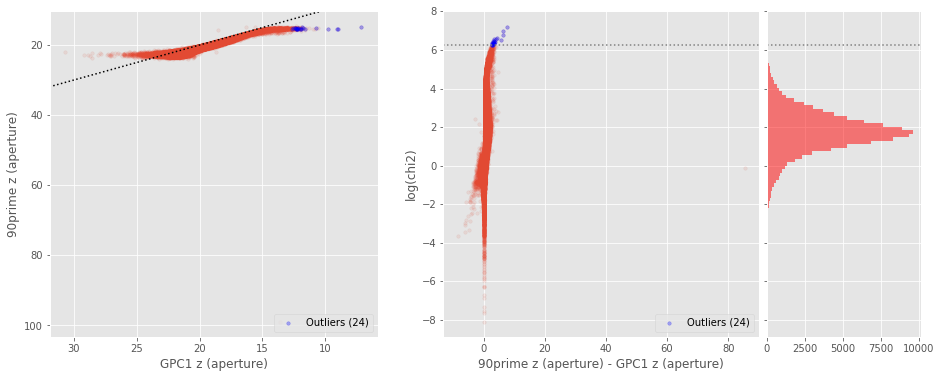

90prime z (total) - GPC1 z (total) (108981 sources):
- Median: -0.20
- Median Absolute Deviation: 0.13
- 1% percentile: -1.2456600189208984
- 99% percentile: 0.7505413055419916
Outliers separation: log(chi2) = 5.75
Number of outliers: 6



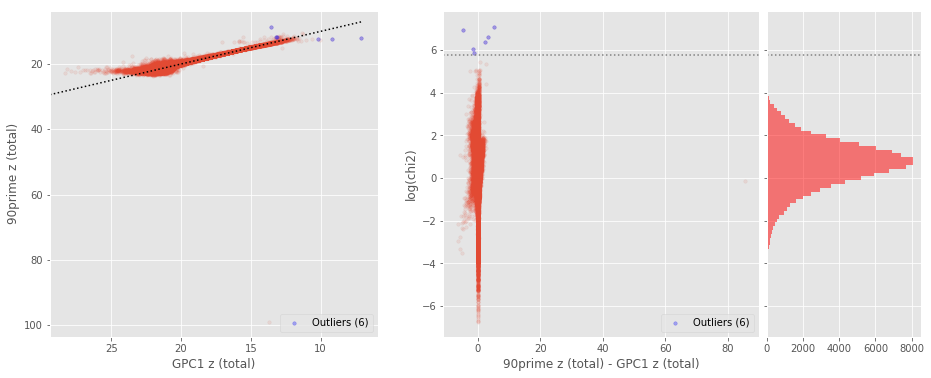

BASS z (aperture) - DECAM z (aperture) (182162 sources):
- Median: 0.00
- Median Absolute Deviation: 0.15
- 1% percentile: -1.6738953399658203
- 99% percentile: 2.337906265258781
Outliers separation: log(chi2) = 3.78
Number of outliers: 1954



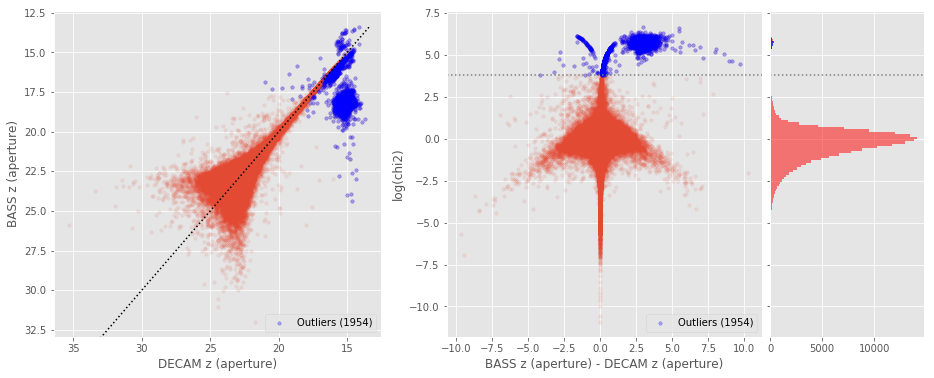

BASS z (total) - DECAM z (total) (185073 sources):
- Median: -0.03
- Median Absolute Deviation: 0.14
- 1% percentile: -1.4096139526367186
- 99% percentile: 0.9663287353515624
Outliers separation: log(chi2) = 4.35
Number of outliers: 436



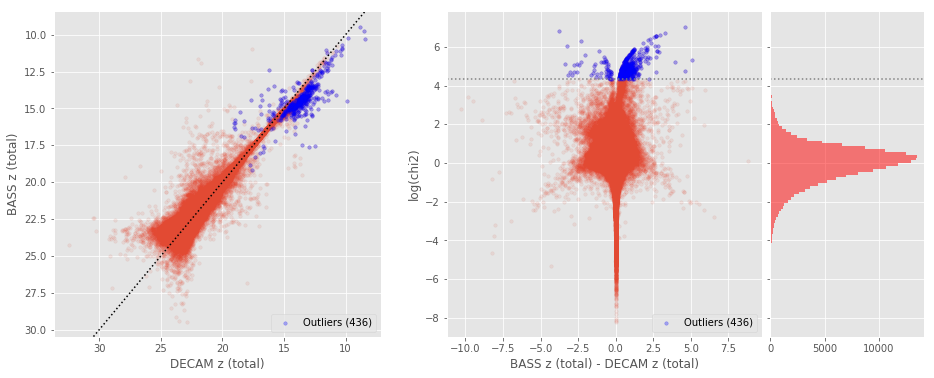

90prime z (aperture) - DECAM z (aperture) (137257 sources):
- Median: 0.89
- Median Absolute Deviation: 0.19
- 1% percentile: -0.3958616638183594
- 99% percentile: 1.4888987731933594
Outliers separation: log(chi2) = 6.50
Number of outliers: 0



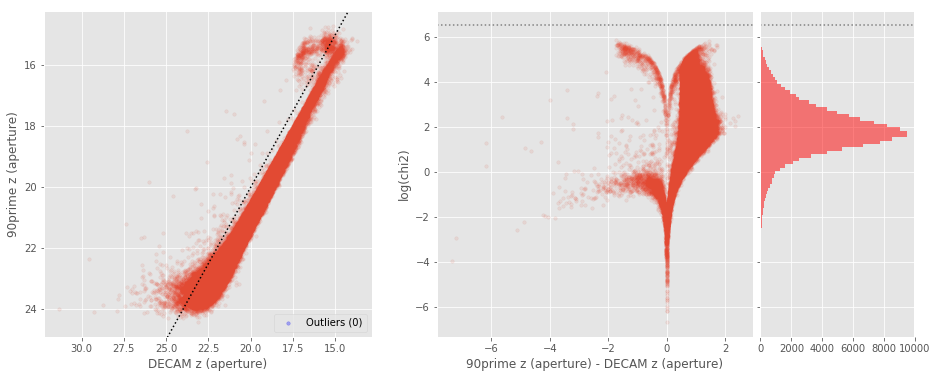

90prime z (total) - DECAM z (total) (137407 sources):
- Median: 0.06
- Median Absolute Deviation: 0.14
- 1% percentile: -1.1099947547912596
- 99% percentile: 0.7794004440307619
Outliers separation: log(chi2) = 5.34
Number of outliers: 57



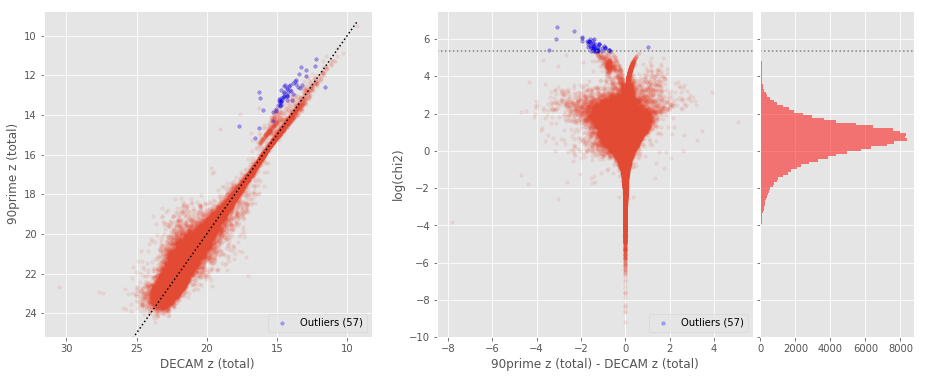

90prime z (aperture) - BASS z (aperture) (121941 sources):
- Median: 0.85
- Median Absolute Deviation: 0.20
- 1% percentile: -1.3515640258789061
- 99% percentile: 1.4728759765625004
Outliers separation: log(chi2) = 6.54
Number of outliers: 0



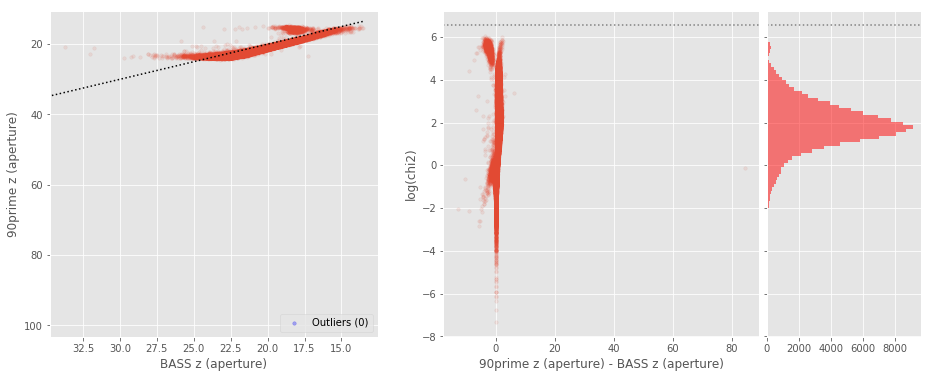

90prime z (total) - BASS z (total) (122203 sources):
- Median: 0.09
- Median Absolute Deviation: 0.15
- 1% percentile: -1.181374053955078
- 99% percentile: 0.8647583007812494
Outliers separation: log(chi2) = 5.37
Number of outliers: 69



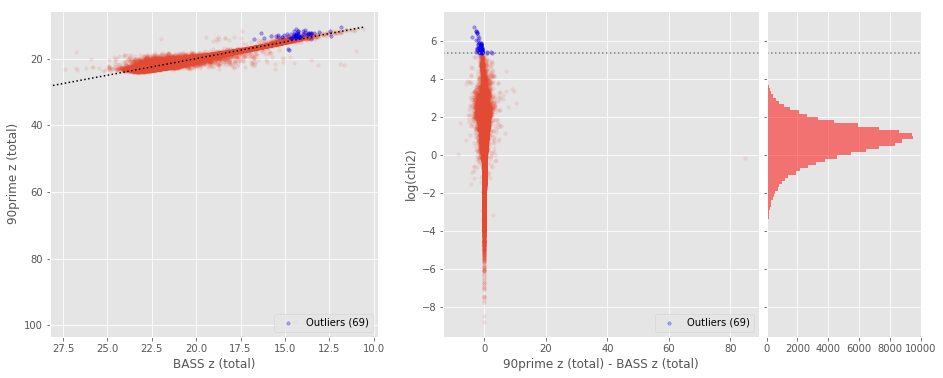

WFCAM J (aperture) - NEWFIRM J (aperture) (74568 sources):
- Median: -0.61
- Median Absolute Deviation: 0.16
- 1% percentile: -1.3459513092041016
- 99% percentile: -0.06675848007202148
Outliers separation: log(chi2) = 6.06
Number of outliers: 279



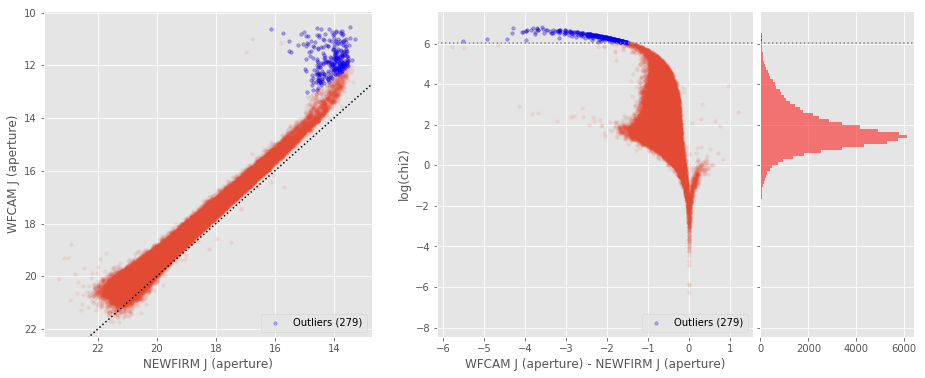

WFCAM J (total) - NEWFIRM J (total) (74579 sources):
- Median: 0.04
- Median Absolute Deviation: 0.13
- 1% percentile: -0.7373303794860839
- 99% percentile: 1.0360435104370118
Outliers separation: log(chi2) = 4.04
Number of outliers: 660



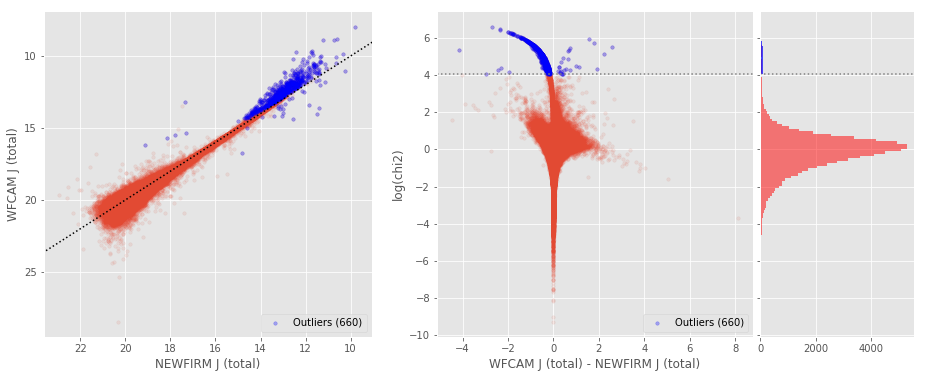

MOSAIC K (aperture) - NEWFIRM K (aperture) (41429 sources):
- Median: -1.96
- Median Absolute Deviation: 0.16
- 1% percentile: -5.408357653930665
- 99% percentile: -1.2410602030029303
Outliers separation: log(chi2) = 5.32
Number of outliers: 18



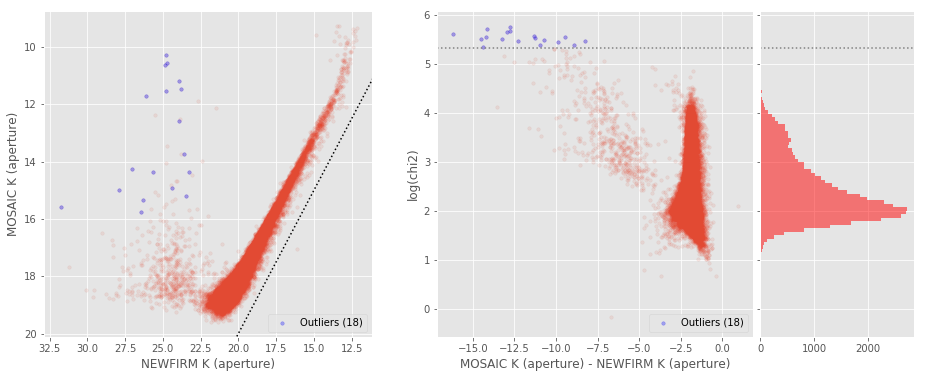

MOSAIC K (total) - NEWFIRM K (total) (41382 sources):
- Median: -1.77
- Median Absolute Deviation: 0.17
- 1% percentile: -3.8388072402648916
- 99% percentile: -0.9337334681701598
Outliers separation: log(chi2) = 4.86
Number of outliers: 49



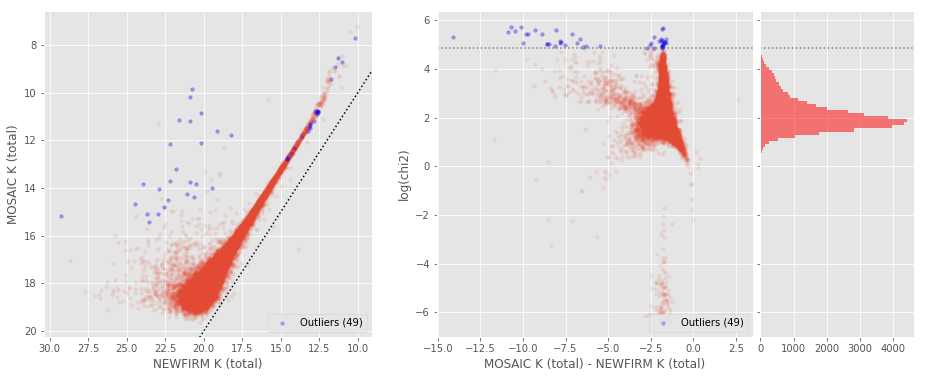

In [24]:
for band_of_a_kind in all_bands:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
        
        if basecol1 == "gpc1_g" and basecol2 == "decam_g":
            savefig = True
        else:
            savefig = False
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        ecol1, ecol2 = "merr_ap_{}".format(basecol1), "merr_ap_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2],
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)), savefig=savefig)
        
        # Tot mag
        col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
        ecol1, ecol2 = "merr_{}".format(basecol1), "merr_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2], 
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (total)".format(band1), "{} (total)".format(band2)))
        
plt.close() 
plt.close()
plt.close()
plt.close()

## 4. Aperture correction issues

In [22]:
def apcor_check(x, y, stellarity, labels=["x", "y"], savefig=False):
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    #fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))   # 
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(stellarity)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    stellarity = np.copy(stellarity[mask])


    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    
    diff_label = "{} - {}".format(y_label, x_label)
    print("{}:".format(diff_label))
    
    # Subsample
    zoom = (x > 16) & (x < 20)


    # Comparing mag
    ax1.scatter(x, diff, marker='.', alpha=0.1, s=50)
    ax1.invert_xaxis()
    ax1.set_ylabel(diff_label)
    ax1.set_xlabel(x_label)
    

    # Zoom Plot
    y_min, y_max = np.percentile(diff[zoom], [1., 99.])
    y_delta = .1 * (y_max - y_min)
    y_min -= y_delta
    y_max += y_delta

    if len(x[zoom]) < 1000:
        alpha = 0.4
    else:
        alpha = 0.1
    print(len(x[zoom]))
    pl = ax2.scatter(x[zoom], diff[zoom], marker='.', alpha=alpha, s=50, c=stellarity[zoom], cmap="jet")
    ax2.invert_xaxis()
    ax2.set_ylabel(diff_label)
    ax2.set_xlabel(x_label)
    ax2.set_ylim([y_min, y_max])
    fig.colorbar(pl, label="stellarity (1=star)")
    
    #ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(diff[zoom], ax=ax3, bins='knuth', facecolor='black', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_apcorrIssues_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

DECAM g (aperture) - GPC1 g (aperture):
7126


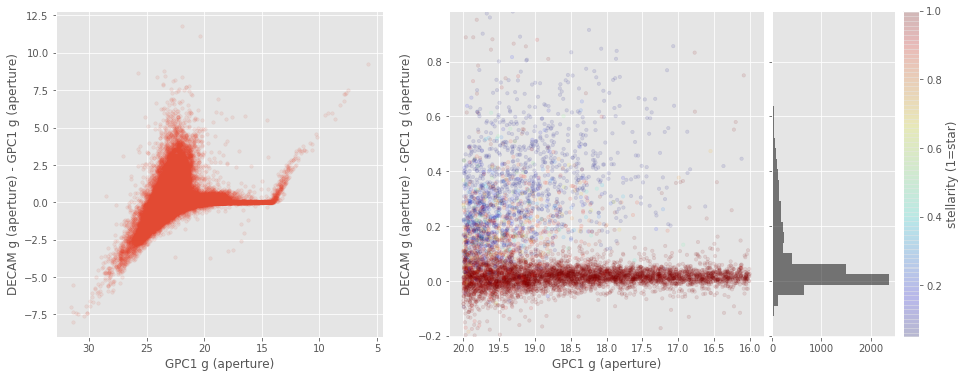

BASS g (aperture) - GPC1 g (aperture):
15558


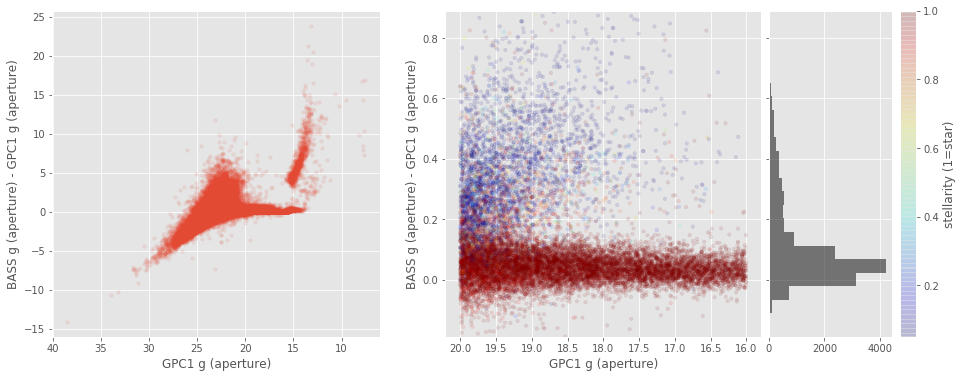

BASS g (aperture) - DECAM g (aperture):
6595


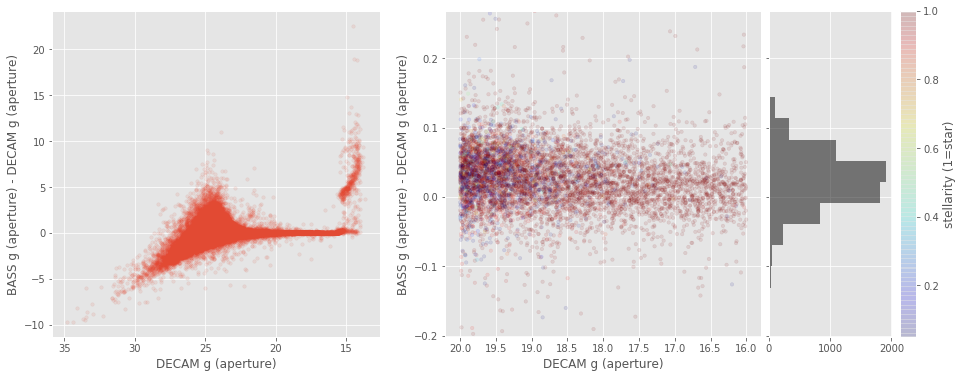

DECAM r (aperture) - GPC1 r (aperture):
12153


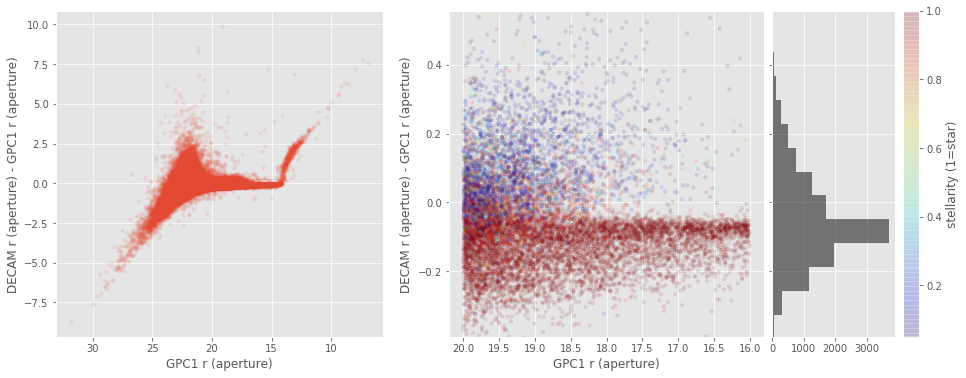

BASS r (aperture) - GPC1 r (aperture):
27063


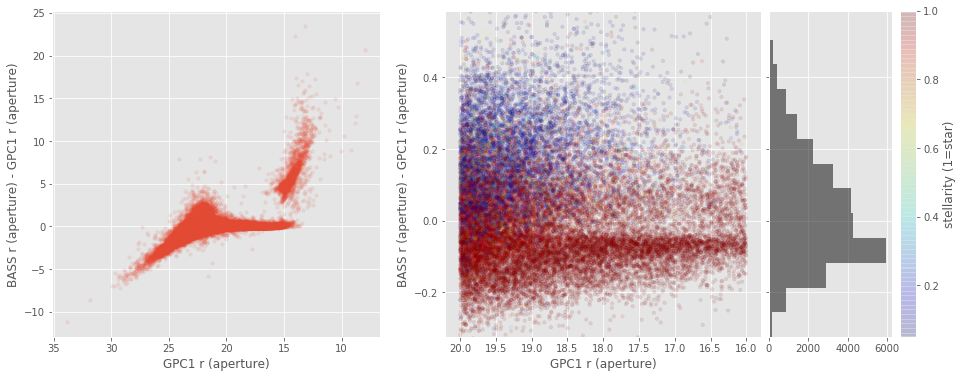

MOSAIC r (aperture) - GPC1 r (aperture):
17255


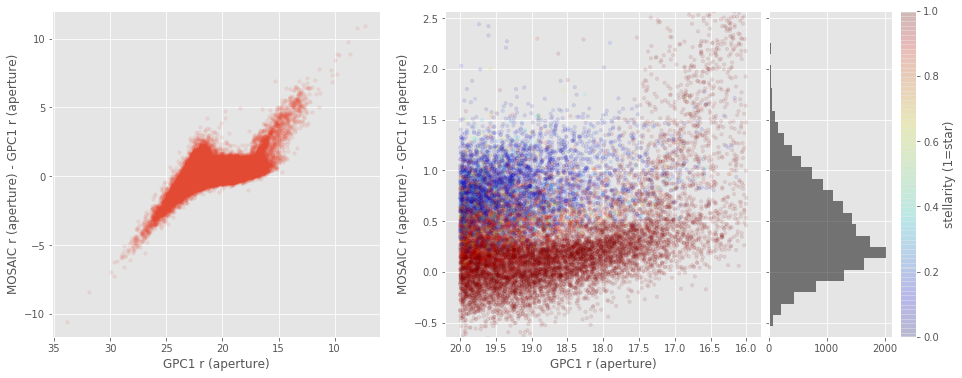

BASS r (aperture) - DECAM r (aperture):
12430


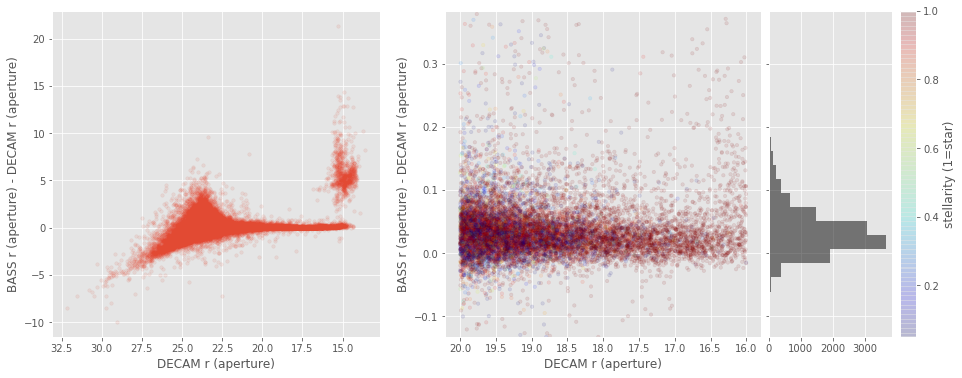

MOSAIC r (aperture) - DECAM r (aperture):
8835


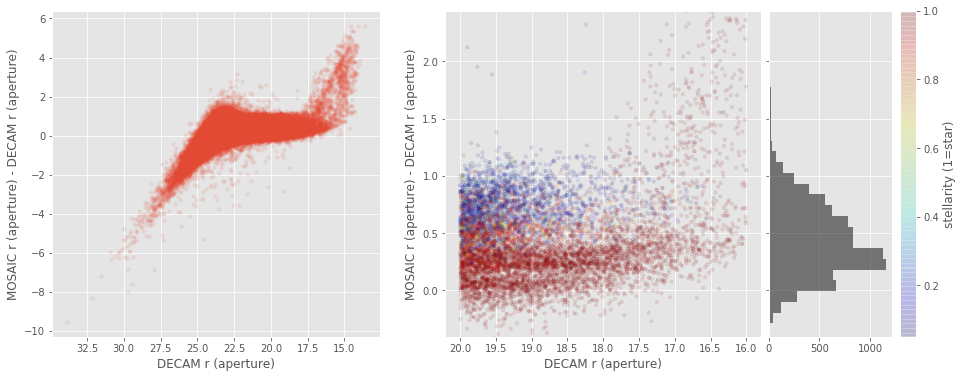

MOSAIC r (aperture) - BASS r (aperture):
16649


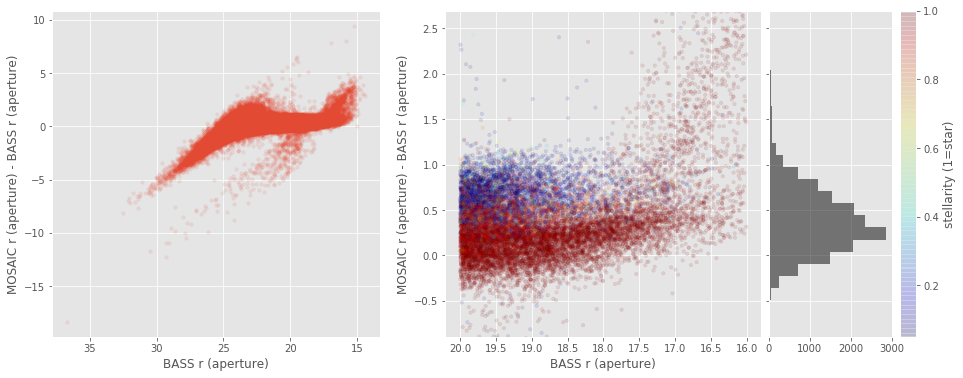

MOSAIC i (aperture) - GPC1 i (aperture):
26542


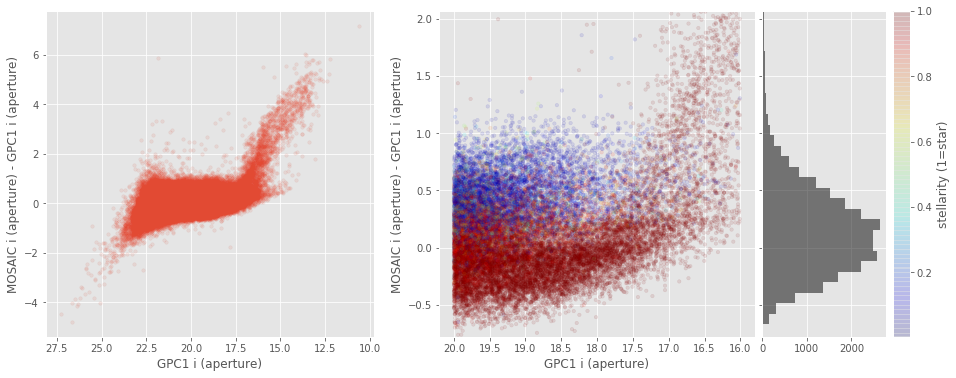

DECAM z (aperture) - GPC1 z (aperture):
38281


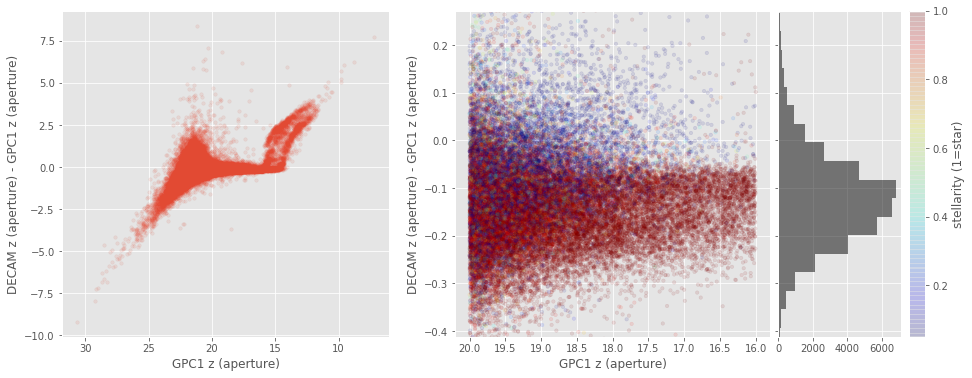

BASS z (aperture) - GPC1 z (aperture):
29585


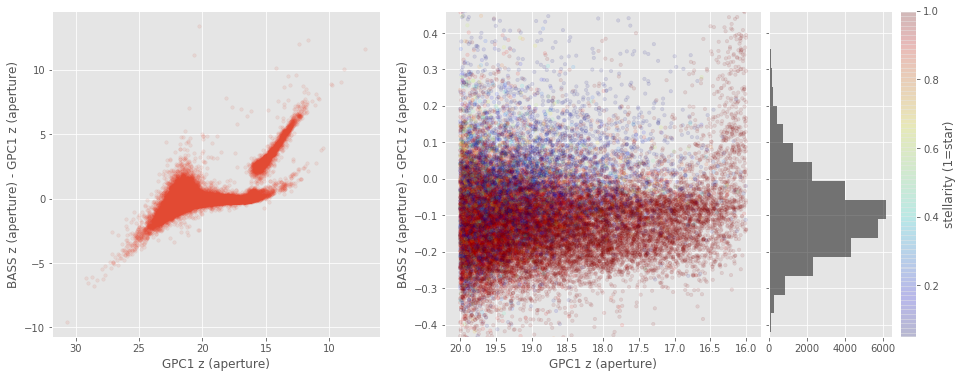

90prime z (aperture) - GPC1 z (aperture):
27179


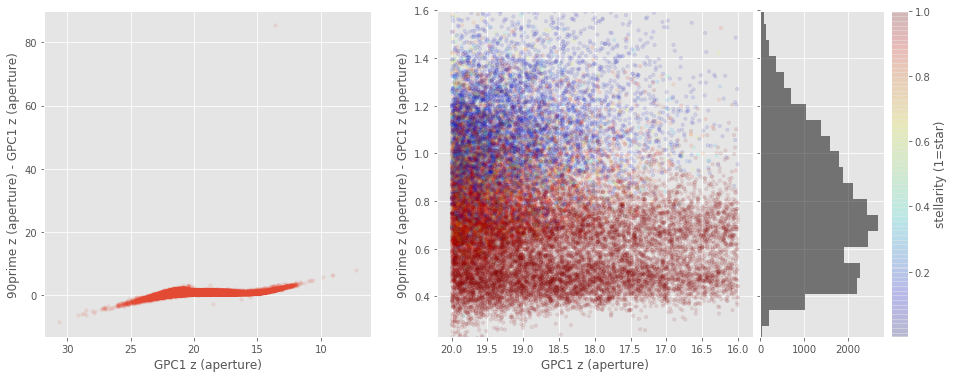

BASS z (aperture) - DECAM z (aperture):
20989


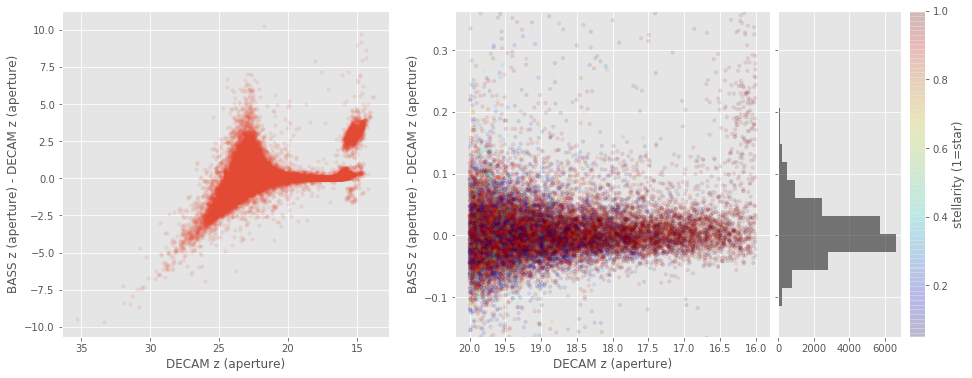

90prime z (aperture) - DECAM z (aperture):
24713


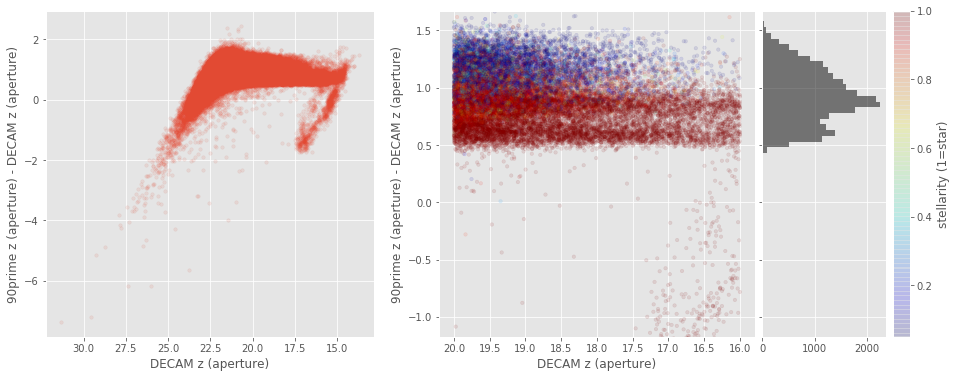

90prime z (aperture) - BASS z (aperture):
20462


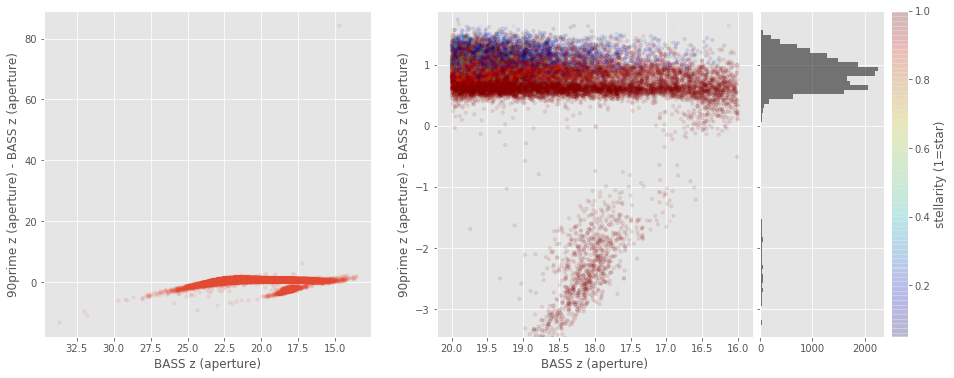

WFCAM J (aperture) - NEWFIRM J (aperture):
31712


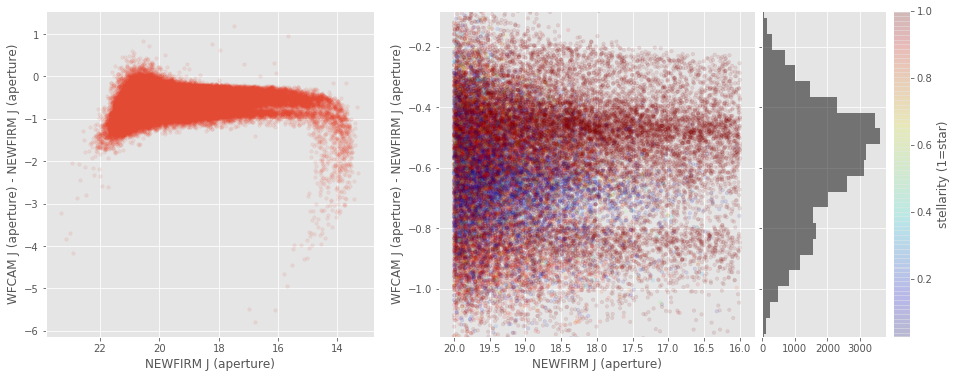

MOSAIC K (aperture) - NEWFIRM K (aperture):
18795


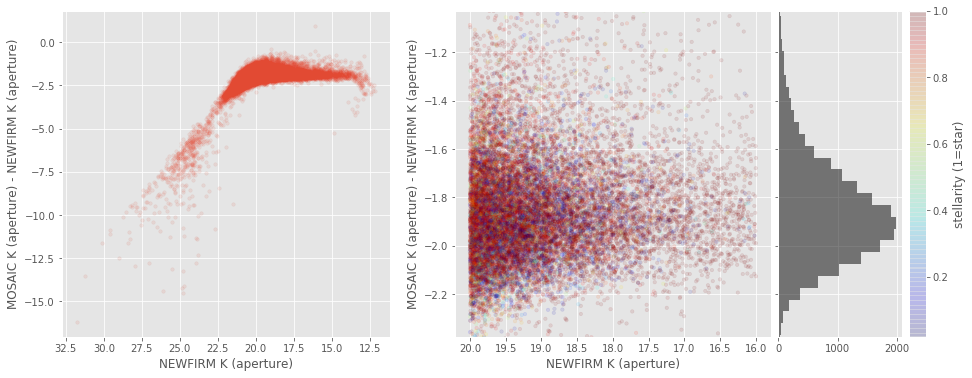

In [26]:
for band_of_a_kind in all_bands:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
       
        if basecol1 == "gpc1_g" and basecol2 == "bass_g":
            savefig = True
        else:
            savefig = False
            
        
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)

        apcor_check(master_catalogue[col1], master_catalogue[col2], master_catalogue['stellarity'],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)), savefig=savefig)
